# Часть I: О теореме Байеса

## Задача 1

Произошло убийство. На месте убийства найдена кровь, которая явно (будем считать, что с вероятностью 1) принадлежит настоящему убийце. Кровь принадлежит редкой группе, которая присутствует всего лишь у 1% населения. И так получилось, что у подсудимого как раз эта редкая группа крови! Первым выходит прокурор и говорит: “Шанс, что у подсудимого была бы именно такая группа крови, если бы он был невиновен -- всего 1%; значит, с вероятностью 99% он виновен, предлагаю осудить”. В чём не прав прокурор? Укажите, какие вероятности он оценил, а какие должен был оценить.

Решение:

Прокурор делает два утверждения.

Первое это "шанс, что у подсудимого была бы именно такая группа крови, если бы он был невиновен - всего $1\%$". Это утверждение правильное. Рассмотрим $P(A|B)$, где $A$ -- событие, означающее что подсудимый имеет редкую группу крови, а $B$ -- событие, означающее невиновность подсудимого. В этом случае вероятность действительно равна $1\%$, так как всего $1\%$ населения обладает такой группой крови, а дополнительной информации о подсудимом у нас нет.

Далее прокурор делает вывод, что из первого утверждения следует виновность подсудимого с вероятностью 99%. Судя по результату, прокурор оценивает вероятность $(1 - P(A|B))$, обратное событие к предыдущему, то есть $P(\overline{A}|B)$ и далее делает утверждение, что эта вероятность равна вероятности $P(\overline{B}|A)$. Это утверждение неверно. 
На самом деле прокурору стоило оценить именно вероятность $P(\overline{B}|A)$.

## Задача 2

Затем выходит адвокат, объясняет ошибки прокурора и берёт слово сам: “В городе живёт миллион человек. Это значит, что примерно у 10000 из них такая группа крови. Значит, всё, что говорит нам эта кровь -- это то, что подсудимый совершил убийство с вероятностью 0.01%. Получается, что это свидетельство не просто не является строгим доказательством, а и вовсе даёт нам ничтожно малую вероятность того, что мой подзащитный виновен, так что предлагаю исключить его из материалов дела”. В чём не прав адвокат? Какие вероятности он оценил, а какие должен был оценить?

Решение:

В первом своем утверждении ("В городе живёт миллион человек. Это значит, что примерно у 10000 из них такая группа крови.") адвокат корректно оценивает априорную вероятность $P(A)$ иметь редкую группу крови. Далее адвокат корректно оценивает вероятность $P(\overline{B}|A)$. Действительно

$$
\begin{align}
P(\overline{B}|A) &= \frac{P(A|\overline{B}) \cdot P(\overline{B})}{P(A)} \\
  &= \frac{1 \cdot \frac{1}{1000000}}{\frac{1}{100}}\\
  &= 0.0001 = 0.01\%
\end{align}
$$

Однако, в дальнейшем адвокат совершает ошибку. Конечно, кровь является доказательством, и чтобы показать это нужно сравнить априорную вероятность случайного человека из города быть убийцей, и вероятность быть убийцей человеку с редкой группой крови.

$$
\frac{P(\overline{B}|A)}{P(\overline{B})} = \frac{10^{-4}}{10^{-6}} = 10^2 = 100
$$
Таким образом, человек с редкой группой крови в сто раз более вероятнее является убийцей, чем случайный житель города.

## Задача 3

In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import json
import numpy as np
import scipy as sp
import scipy.stats as st
import scipy.integrate as integrate
from sklearn import linear_model

sns.set_style("whitegrid")
sns.set_palette("colorblind")
palette = sns.color_palette()
figsize = (15,8)
legend_fontsize = 16
import latex

from matplotlib import rc
rc('font',**{'family':'sans-serif'})
#rc('text', usetex=True)
#rc('text.latex',preamble=r'\usepackage[utf8]{inputenc}')
#rc('text.latex',preamble=r'\usepackage[russian]{babel}')
rc('figure', **{'dpi': 300})

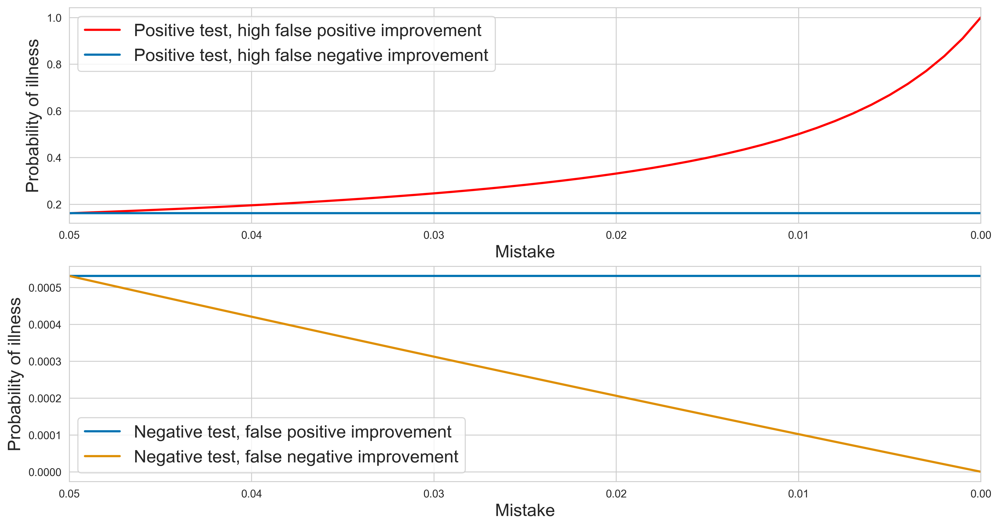

In [2]:
## если data = 1, тест положительный
def compute_posterior(data, prior_prob=0.01, fp=0.05, fn=0.05):
    if data == 1:
        return (prior_prob * (1 - fp)) / (prior_prob * (1 - fp) + (1-prior_prob) * fp)
    elif data == 0:
        return (prior_prob * fn) / (prior_prob * fn + (1-prior_prob) * (1 - fn))
    else:
        return None

#print("Posterior probability after positive test: %.6f" % compute_posterior(1) )
#print("Posterior probability after negative test: %.6f" % compute_posterior(0) )

vector_posterior = np.vectorize(compute_posterior, excluded=['data', 'prior_prob'])
xs = np.arange(0, 0.051, 0.001)
ys_one_fp = vector_posterior(1, fp=xs)
ys_zero_fp = vector_posterior(0, fp=xs)
ys_one_fn = vector_posterior(1, fn=xs)
ys_zero_fn = vector_posterior(0, fn=xs)

fig = plt.figure(figsize=figsize)
ax1 = fig.add_subplot(211)
ax1.plot(xs, ys_one_fp, linewidth=2, label=r'Positive test, high false positive improvement', c='r')
ax1.plot(xs, ys_one_fn, linewidth=2, label=r'Positive test, high false negative improvement')

ax1.set_xlim((0.05, 0.0))
ax1.legend(fontsize=legend_fontsize)
ax1.set_xlabel('Mistake', fontsize=legend_fontsize)
ax1.set_ylabel('Probability of illness', fontsize=legend_fontsize)
# fig.savefig('intro1.pdf', bbox_inches='tight')

ax2 = fig.add_subplot(212)
ax2.plot(xs, ys_zero_fp, linewidth=2, label='Negative test, false positive improvement')
ax2.plot(xs, ys_zero_fn, linewidth=2, label='Negative test, false negative improvement')
ax2.set_xlim((0.05, 0.0))
ax2.legend(fontsize=legend_fontsize)
ax2.set_xlabel('Mistake', fontsize=legend_fontsize)
ax2.set_ylabel('Probability of illness', fontsize=legend_fontsize)
plt.show()

Можно заметить, что положительные тесты не улучшаются от уменьшения false negative ошибки, а отрицательные тесты не улучшаются от false positive ошибки, что логично. Таким образом, имеет смысл сравнивать только положительный тест с уменьшенной false positive ошибкой и отрицательный тест с false negative ошибкой.

Можно заметить, что на нижнем графике уменьшение вероятности заболевания происходит практически линейно, из-за того что отрезок графика очень небольшой. В противовес этому, с уменьшением false positive ошибки, точность положительного теста растет гораздо быстрее. 

В целом рекомендации врачам могут различаться в зависимости от ситуации. К примеру, если тест и лечение дорогие, либо ресурс лекарства в целом ограничен и его не хватает на всех, то имеет смысл снижать false positive ошибку, и тогда мы будем более уверены, что потратим лекарство только на больных людей. Однако, в большинстве случаев нам все же выгоднее снижать false negative ошибку. Это связано с тем, что человек, ошибочно получивший положительный тест в конечном итоге обнаружит что здоров, переделав тест несколько раз либо в процессе лечения. Однако, ошибочно получив отрицательный результат, человек может позволить заболеванию развиться слишком сильно, заразить много окружающих и в конце концов умереть. Таким образом, потери от false negative теста как правило оказываются сильно выше, поэтому несмотря на то, что вероятность заболевания уменьшается ненамного в абсолютных значениях, снижать необходимо именно это ошибку.

# Часть II: О линейной регрессии

## Задание 1

In [3]:
import pandas as pd
import numpy as np

In [4]:
data = pd.read_csv('owid-covid-data.csv')
data = data[data['location'] == 'Russia']
data['date'] = pd.to_datetime(data['date'])
data['new_cases'].replace(to_replace=0.0, value=1.0, inplace=True)
train_data = data[(data['date'] >= '2020-03-03') & (data['date'] < '2020-04-22')]


In [5]:
train_data.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
52118,RUS,Europe,Russia,2020-03-03,3.0,1.0,0.143,NaN,NaN,0.0,...,24765.954,0.1,431.297,6.18,23.4,58.3,NaN,8.05,72.58,0.824
52119,RUS,Europe,Russia,2020-03-04,3.0,1.0,0.143,NaN,NaN,0.0,...,24765.954,0.1,431.297,6.18,23.4,58.3,NaN,8.05,72.58,0.824
52120,RUS,Europe,Russia,2020-03-05,4.0,1.0,0.286,NaN,NaN,0.0,...,24765.954,0.1,431.297,6.18,23.4,58.3,NaN,8.05,72.58,0.824
52121,RUS,Europe,Russia,2020-03-06,13.0,9.0,1.571,NaN,NaN,0.0,...,24765.954,0.1,431.297,6.18,23.4,58.3,NaN,8.05,72.58,0.824
52122,RUS,Europe,Russia,2020-03-07,13.0,1.0,1.571,NaN,NaN,0.0,...,24765.954,0.1,431.297,6.18,23.4,58.3,NaN,8.05,72.58,0.824


In [6]:
train_data.shape

(50, 59)

## Задание 2

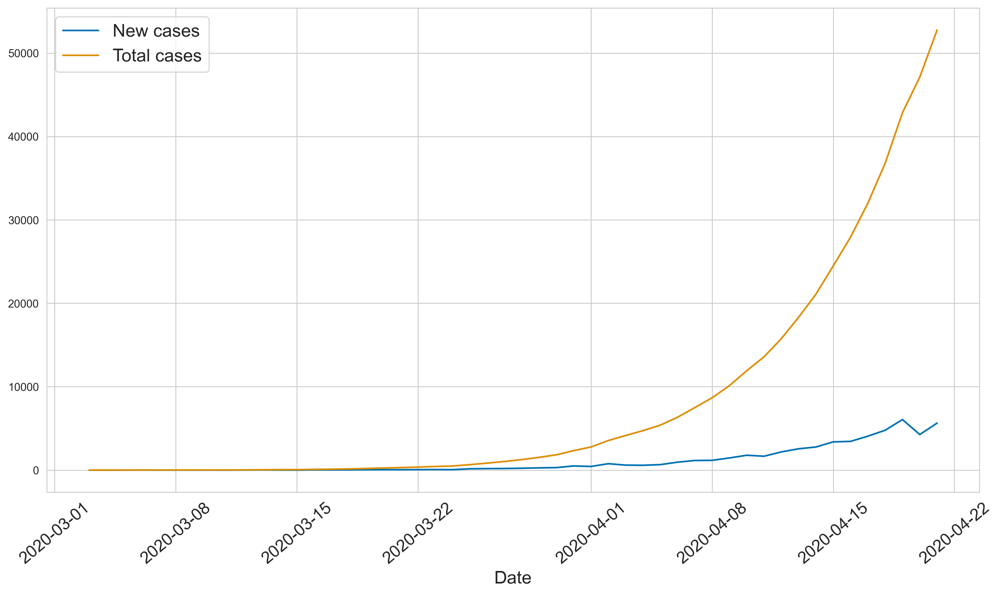

In [7]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
ax.plot(train_data.date, train_data.new_cases, label='New cases')
ax.plot(train_data.date, train_data.total_cases, label='Total cases')
ax.legend(fontsize=legend_fontsize)
ax.set_xlabel('Date', fontsize=legend_fontsize)
ax.xaxis.set_tick_params(labelsize=15, labelrotation=40)

### a.

In [8]:
from sklearn import linear_model

In [9]:
days = np.arange(1, 51, 1).reshape(-1, 1)

In [10]:
exp_model = linear_model.LinearRegression(fit_intercept=True).fit(days, np.log(train_data.total_cases))
exp_model_1 = linear_model.Ridge(fit_intercept=True, alpha=1).fit(days, np.log(train_data.total_cases))
exp_model_10 = linear_model.Ridge(fit_intercept=True, alpha=10).fit(days, np.log(train_data.total_cases))
exp_model_50 = linear_model.Ridge(fit_intercept=True, alpha=50).fit(days, np.log(train_data.total_cases))
exp_model_100 = linear_model.Ridge(fit_intercept=True, alpha=100).fit(days, np.log(train_data.total_cases))
exp_model_1000 = linear_model.Ridge(fit_intercept=True, alpha=1000).fit(days, np.log(train_data.total_cases))
exp_model_1500 = linear_model.Ridge(fit_intercept=True, alpha=1500).fit(days, np.log(train_data.total_cases))
y_true = train_data.total_cases.values

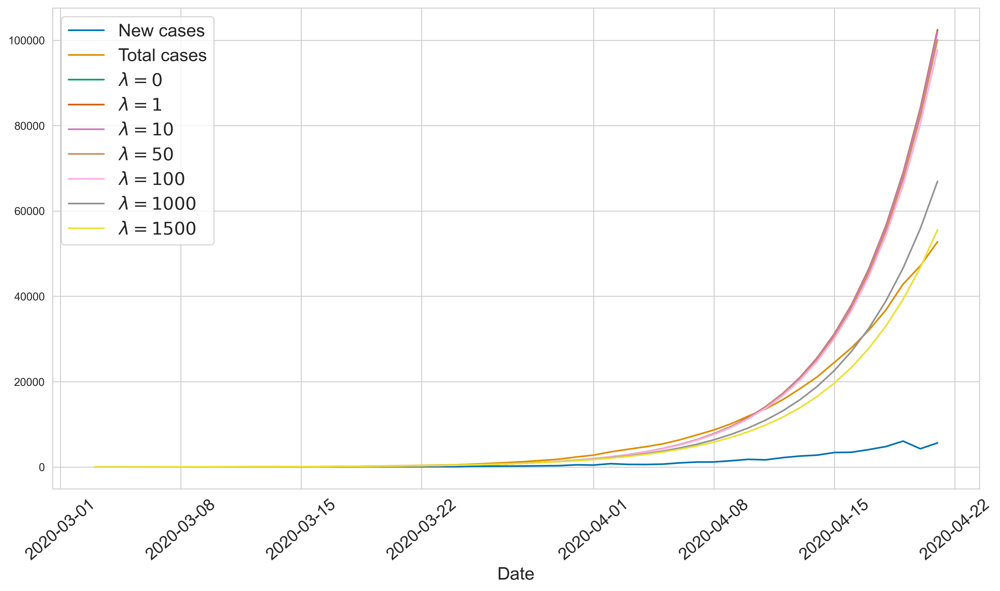

In [11]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
ax.plot(train_data.date, train_data.new_cases, label='New cases')
ax.plot(train_data.date, y_true, label='Total cases')
ax.plot(train_data.date, np.exp(exp_model.predict(days)), label = '$\lambda=0$')
ax.plot(train_data.date, np.exp(exp_model_1.predict(days)), label='$\lambda=1$')
ax.plot(train_data.date, np.exp(exp_model_10.predict(days)), label='$\lambda=10$')
ax.plot(train_data.date, np.exp(exp_model_50.predict(days)), label='$\lambda=50$')
ax.plot(train_data.date, np.exp(exp_model_100.predict(days)), label='$\lambda=100$')
ax.plot(train_data.date, np.exp(exp_model_1000.predict(days)), label='$\lambda=1000$')
ax.plot(train_data.date, np.exp(exp_model_1500.predict(days)), label='$\lambda=1500$')
ax.legend(fontsize=legend_fontsize)
ax.set_xlabel('Date', fontsize=legend_fontsize)
ax.xaxis.set_tick_params(labelsize=15, labelrotation=40)

In [12]:
sigma_noise = np.sqrt(np.sum((exp_model.predict(days) - np.log(y_true))**2)/len(y_true))
print(sigma_noise)

0.3490422059635659


In [13]:
exp_model.coef_

array([0.19829091])

In [14]:
exp_model.intercept_

1.6224462364488117

Получили примерную оценку шума по данным в нашей модели. Неплохо, но можно получить значение получше. Так и сделаем.

### b.

Пусть априорное распределение весов нашей модели будет нормальным со средним в нуле и дисперсией 25, чтобы достигнуть достаточной широты.

$$
p(w) = \mathcal{N}(w | 0,\,  25\mathbf{I})
$$

Найдем оптимальный гиперпараметр шума в данных.

In [15]:
from scipy.optimize import minimize
days_bias = np.hstack((days, np.ones(days.shape)))

In [16]:
def A(beta, alpha, X):
    return 1/beta * (X.T @ X) + 1/alpha * np.eye(X.shape[1])

def m(beta, alpha, X,  y):
    return 1/beta * (np.linalg.inv(A(beta, alpha, X)) @ X.T) @ y.reshape(-1, 1)

def lnpd(beta, alpha, X, y):
    mn = m(beta, alpha, X, y.reshape(1, -1))
    return -(len(y_true)/2 * np.log(1/beta)
                 - 1/(beta * 2) * np.sum((y.reshape(-1, 1) - X @ mn) ** 2)
                 - 1/(alpha * 2) * mn.T @ mn
                 - 1/2 * np.log(np.linalg.det(A(beta, alpha, X)))
                )[0][0]



In [17]:
hyperparameter_estimation = minimize(lnpd, 10, (25, days_bias, np.log(y_true)), bounds = [(0.0001, None)])

In [18]:
print(hyperparameter_estimation)

      fun: -18.90825550860766
 hess_inv: <1x1 LbfgsInvHessProduct with dtype=float64>
      jac: array([-4.97379915e-06])
  message: b'CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL'
     nfev: 34
      nit: 8
     njev: 17
   status: 0
  success: True
        x: array([0.12690573])


In [19]:
sigma_noise = hyperparameter_estimation.x[0]
print(sigma_noise)

0.1269057335965278


Text(0, 0.5, '$\\log p(D|alpha,beta)$')

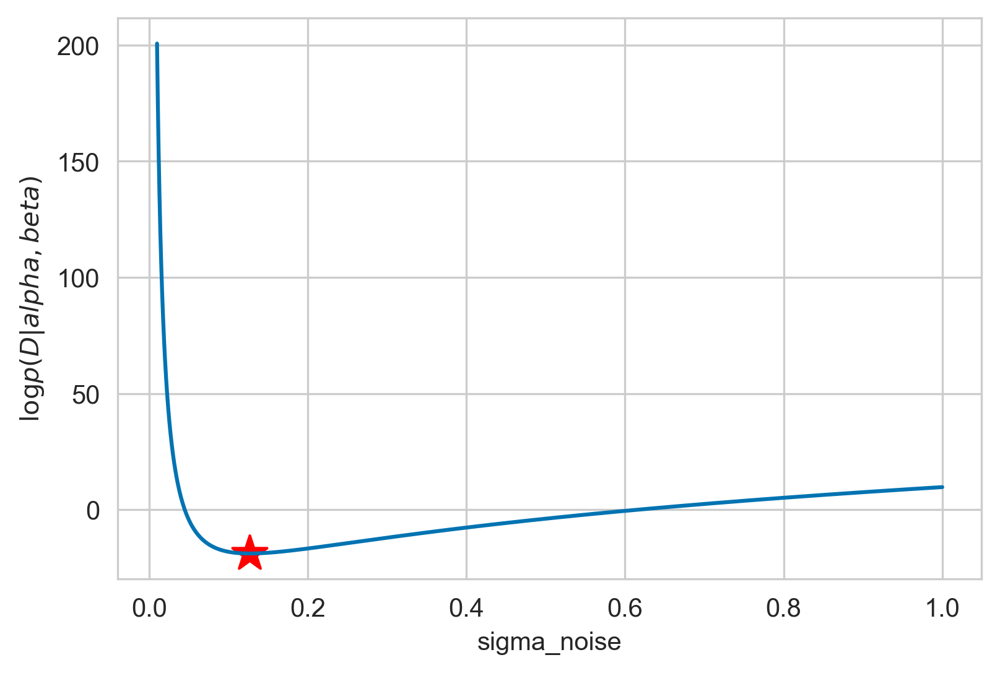

In [20]:
a = np.linspace(0.01, 1, 10000)
b = np.array(list(map(lambda x: lnpd(x, 25, days_bias, np.log(y_true)), a)))
plt.scatter(sigma_noise, lnpd(sigma_noise, 25, days_bias, np.log(y_true)), marker='*', c='r', s=200)
plt.plot(a, b)
plt.xlabel('sigma_noise')
plt.ylabel('$\log p(D|alpha,beta)$')

Мы получили оптимальный гиперпараметр `sigma_noise`. Воспользуемся им.

In [21]:
cur_mu, cur_sigma = np.array([0, 0]), 25*np.array([[1, 0], [0, 1]])

In [22]:
def bayesian_update(mu, sigma, x, y, sigma_noise=.25):
    x_matrix = np.array([[1, x]])
    sigma_n = np.linalg.inv(np.linalg.inv(sigma)+ (1 / (sigma_noise ** 2)) * np.matmul(np.transpose(x_matrix), x_matrix) )
    mu_n = np.matmul(sigma_n, np.matmul(np.linalg.inv(sigma), np.transpose(mu)) + (1 / (sigma_noise ** 2)) * np.matmul(np.transpose(x_matrix), np.array([y]) ) )
    return mu_n, sigma_n

In [23]:
mus, sigmas = [cur_mu], [cur_sigma]
for day, total in zip(np.arange(1, 51, 1), y_true):
    cur_mu, cur_sigma = bayesian_update(cur_mu, cur_sigma, day, np.log(total), sigma_noise=sigma_noise)
    mus.append(cur_mu)
    sigmas.append(cur_sigma)

In [24]:
mus = list(zip(*mus))

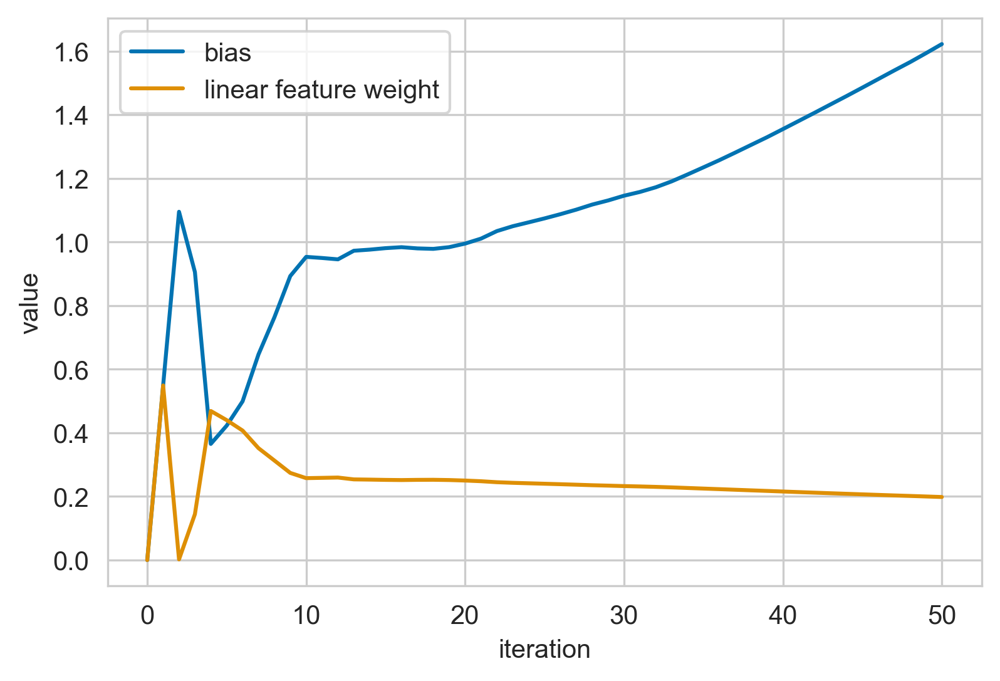

In [25]:
plt.xlabel('iteration')
plt.ylabel('value')
plt.plot(mus[0], label='bias')
plt.plot(mus[1], label='linear feature weight')
plt.legend();

In [26]:
print(mus[0][-1], mus[1][-1])

1.6223603794821386 0.19829345956690136


In [27]:
print(sigmas[-1])

[[ 1.32777561e-03 -3.94388789e-05]
 [-3.94388789e-05  1.54664263e-06]]


In [28]:
print(exp_model.intercept_, exp_model.coef_[0],)

1.6224462364488117 0.19829091233588558


Мы нашли апостериорное распределение весов. Как мы можем заметить, математические ожидания нашей байесовской модели почти целиком совпали с моделью обычной линейной регрессии из `sklearn`.

$$
p(w|D) = \mathcal{N}(w|\mu, \Sigma)\\
$$

$$
\mu = \begin{pmatrix} 1.62236 \\0.19829  \end{pmatrix}
$$

$$
\sigma = \begin{pmatrix} 
            0.001327 & 0.000039 \\
            0.000039 & 0.000001
          \end{pmatrix}
$$

In [29]:
posterior_mu = np.array([mus[0][-1], mus[1][-1]])
posterior_sigma = sigmas[-1]

### c.

Посэмплируем сигмоиды и апостериорного распределения и построем графики.

In [30]:
def myplot_sample_lines(mu, sigma, n=20, points=None, scale='log'):
    # Посэмплируем и порисуем прямые
    my_w = np.random.multivariate_normal(mu, sigma, n)
    new_days = np.arange(0, len(data['date'][:220]), 1)

    # plt.axis('equal')
    if scale == 'log':
        for w in my_w:
            plt.semilogy(data['date'][:220], np.exp(w[0] + w[1]*new_days), 'k-', lw=.4)
    else:
        for w in my_w:
            plt.plot(data['date'][:220], np.exp(w[0] + w[1]*new_days), 'k-', lw=.4)
    #plt.ylim((-3, 3))
    #plt.xlim((-3, 3))
    if not points is None:
        plt.scatter(points[0], points[1], marker='*', s=200)

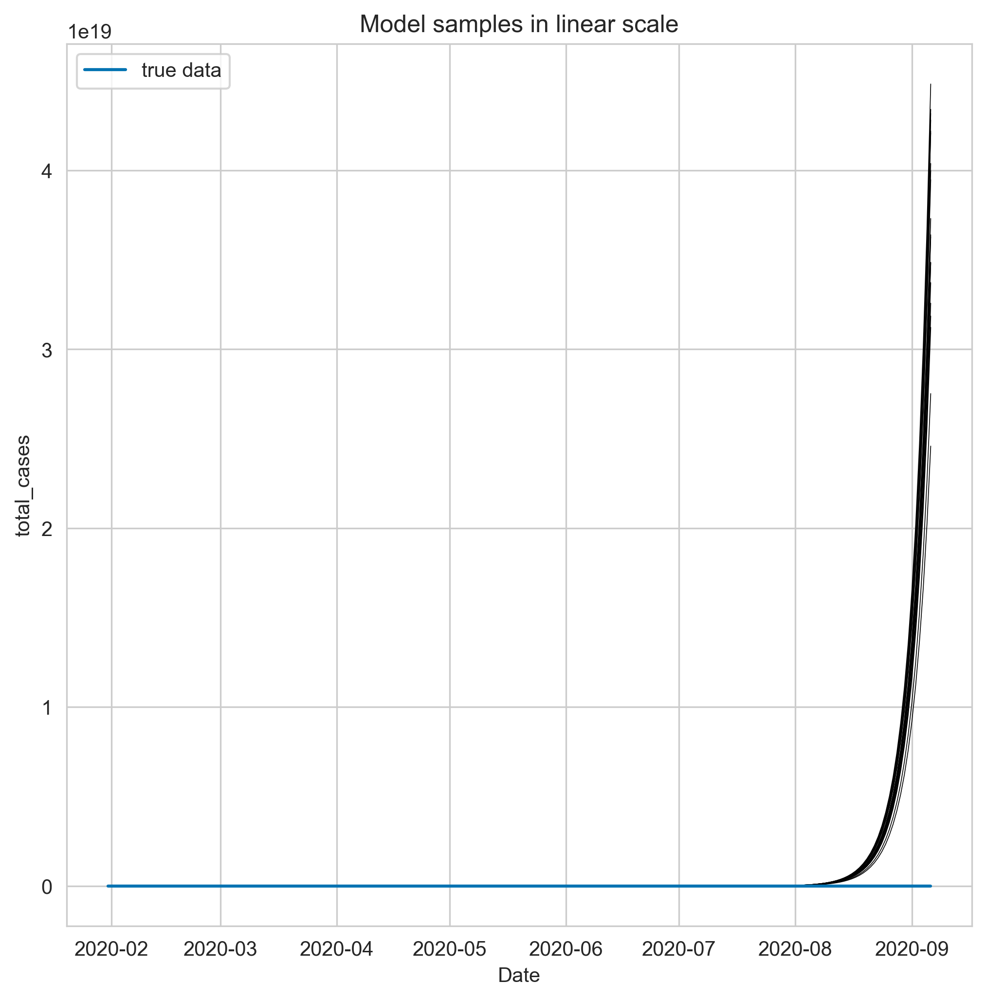

In [31]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines(posterior_mu, posterior_sigma, 20, scale='linear')
plt.plot(data['date'][:220], data['total_cases'][:220], label='true data')
plt.legend()
plt.xlabel('Date')
plt.ylabel('total_cases')
plt.title('Model samples in linear scale');

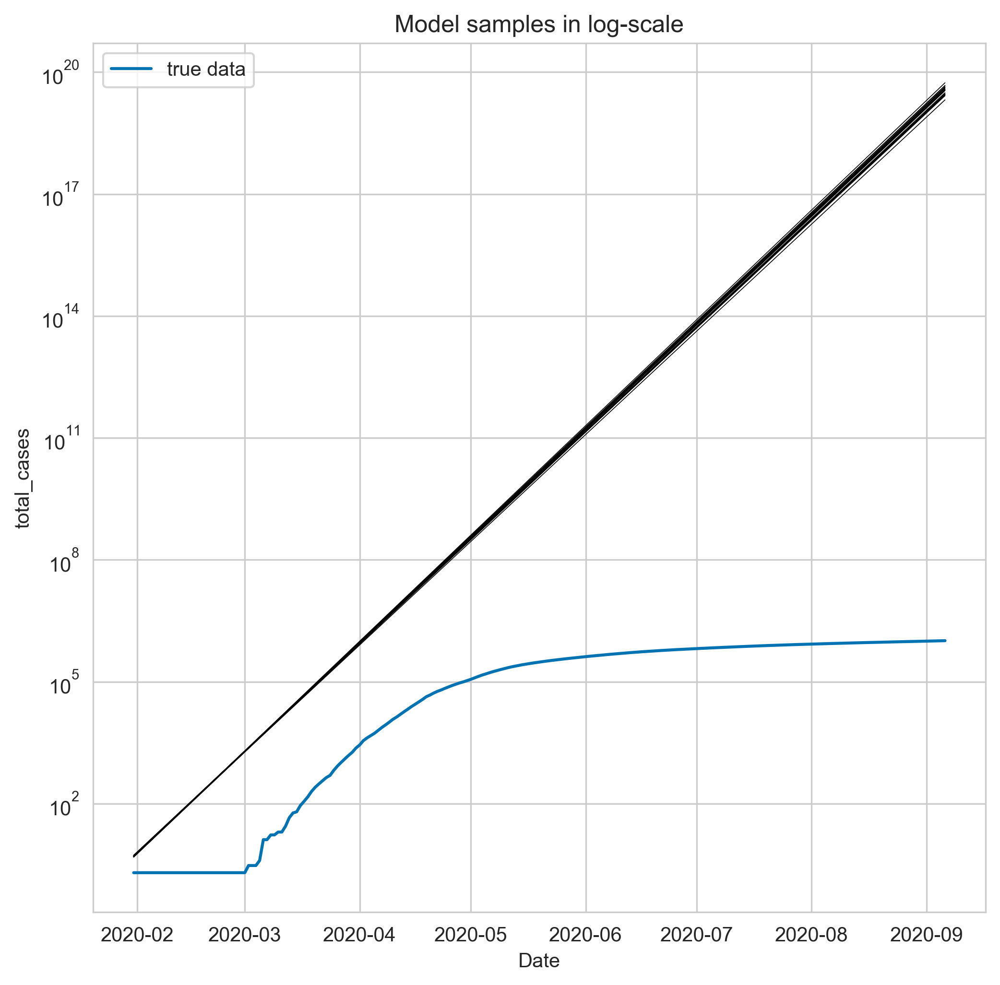

In [32]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines(posterior_mu, posterior_sigma, 20)
plt.plot(data['date'][:220], data['total_cases'][:220], label='true data')
plt.xlabel('Date')
plt.ylabel('total_cases')
plt.title('Model samples in log-scale')
plt.legend();

Согласно предсказаниям нашей модели, к 1 мая число заболевших в России превысит 100 миллионов (примерное население России), к 1 июня превысит 100 миллиардов (около 12 населений мира или 1000 населений России), к 1 сентября превысит 10 миллионов триллионов (примерно 1.25 миллиарда населений мира или 100 миллиардов населений России).

Построим предсказательные распределения исходя из данных сэмплирования.

In [33]:
def sample_statistics(mu, sigma, xs, n=200):
    my_w = np.random.multivariate_normal(mu, sigma, n)
    res = np.zeros((n, xs.shape[0]))
    for i,w in enumerate(my_w):
        res[i,:] = w[0] + w[1]*xs
    return res

In [34]:
# Нарисуем результат
def plot_predictions(xs, mu, x):
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    ax.set_xlim((xs[0], xs[-1]))
    #ax.set_ylim((-2, 2))
    ax.plot(xs, y_true, label="Правильный ответ")
    ax.plot(xs, np.exp(mu[1]*xs + mu[0]), color="red", label="MAP гипотеза")
    ax.fill_between(xs, np.exp(mu[1]*xs + mu[0] - sigma_noise), np.exp(mu[1]*xs + mu[0] + sigma_noise), color=palette[5], alpha=.2, label="+- дисперсия шума")
    ax.fill_between(xs, np.exp(np.mean(x, axis=0) - np.std(x, axis=0)), np.exp(np.mean(x, axis=0) + np.std(x, axis=0)), color=palette[1], alpha=.3, label="+- дисперсия предсказаний")
    #ax.scatter(points[0], points[1], marker='*', s=200)
    ax.legend()

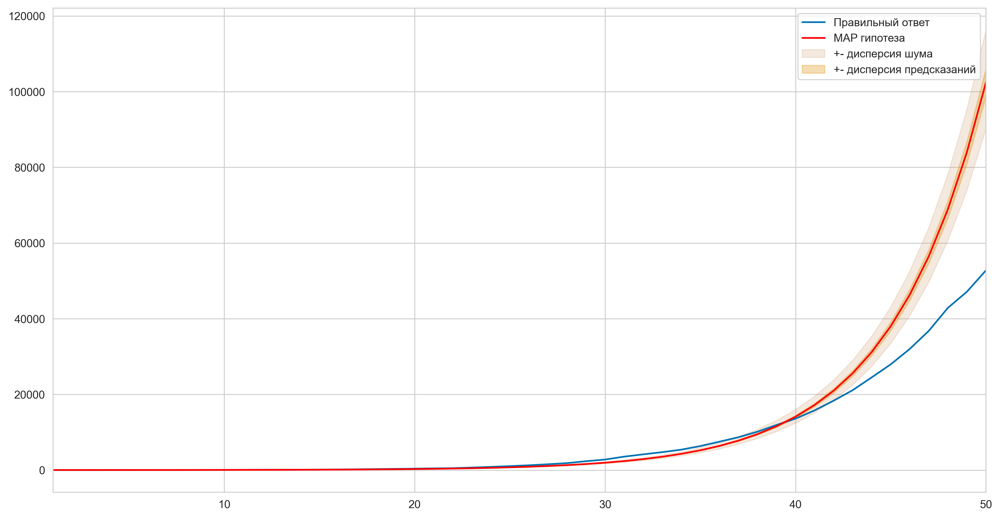

In [35]:
x = sample_statistics(posterior_mu, posterior_sigma, days.flatten(), n=100)
plot_predictions(days.flatten(), cur_mu, x)

Видим, что дисперсия шума в данных выше чем дисперсия наших предсказаний. Можно сделать вывод, что модель уверена в своих, хоть и не совсем верных, предсказаниях.

## 3.

### a.

$$
\Phi(x) = \frac{1}{\sqrt{2 \pi}}\int_{- \infty}^{x} e^{- t^2/2}dt
$$

Перед нами пробит, функция нормального распределения. Попробуем моделировать не ее саму, а ее производную, плотность распределения, чтобы избавиться от ненавистного интеграла. Производная от целевой переменной есть не что иное как `new_cases`, так что будем моделировать ее.

$$
\varphi(x) = \frac 1{\sqrt{2\pi}}e^{- \frac 12 x^2}
$$

Константа нам не важна, посчитаем что под экспонентой стоит произвольная квадратичная функция, получим

$$
y \approx e^{w0 + w_1\cdot x + w_2 \cdot x^2}
$$

или

$$
log(y) \approx w_0 + w_1 \cdot x + w_2 \cdot x^2
$$


### b.

Найдем оптимальный гипепараметр шума в данных.

In [36]:
days_sq = np.hstack((days**2, days, np.ones(days.shape)))
y_new = train_data.new_cases.values

In [37]:
hyperparameter_estimation = minimize(lnpd, 10, (25, days_sq, np.log(y_new)), bounds = [(0.0001, None)])

In [38]:
print(hyperparameter_estimation)

      fun: 5.122503028742246
 hess_inv: <1x1 LbfgsInvHessProduct with dtype=float64>
      jac: array([7.63833441e-06])
  message: b'CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL'
     nfev: 30
      nit: 8
     njev: 15
   status: 0
  success: True
        x: array([0.25454986])


In [39]:
sigma_new = hyperparameter_estimation.x[0]
print(sigma_new)

0.25454985999766105


`sigma_new` наш новый гиперпараметр шума в данных.

Text(0, 0.5, '$\\log p(D|alpha,beta)$')

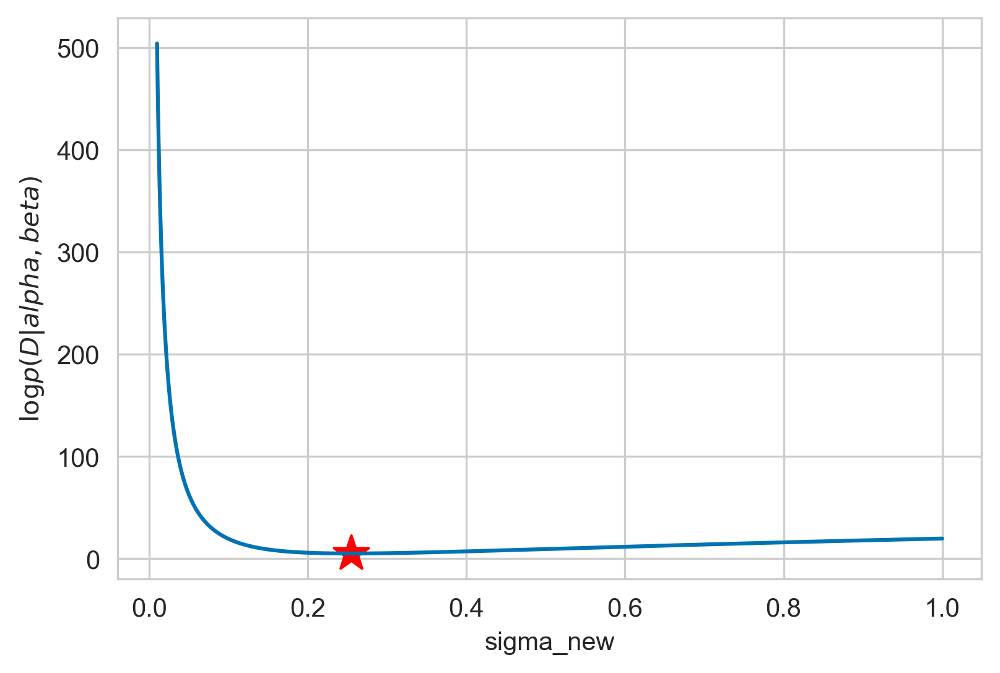

In [40]:
a = np.linspace(0.01, 1, 10000)
b = np.array(list(map(lambda x: lnpd(x, 25, days_sq, np.log(y_new)), a)))
plt.scatter(sigma_new, lnpd(sigma_new, 25, days_sq, np.log(y_new)), marker='*', c='r', s=200)
plt.plot(a, b)
plt.xlabel('sigma_new')
plt.ylabel('$\log p(D|alpha,beta)$')

Априорное предположение о весах модели оставим без изменений.
$$
p(w) = \mathcal{N}(w | 0,\,  25\mathbf{I})
$$

In [41]:
def bayesian_update_sq(mu, sigma, x, y, sigma_noise=.25):
    x_matrix = np.array([[1, x, x**2]])
    sigma_n = np.linalg.inv(np.linalg.inv(sigma)+ (1 / (sigma_noise ** 2)) * np.matmul(np.transpose(x_matrix), x_matrix) )
    mu_n = np.matmul(sigma_n, np.matmul(np.linalg.inv(sigma), np.transpose(mu)) + (1 / (sigma_noise ** 2)) * np.matmul(np.transpose(x_matrix), np.array([y]) ) )
    return mu_n, sigma_n

In [42]:
cur_mu, cur_sigma = np.array([0, 0, 0]), 25 * np.eye(3)

In [43]:
mus, sigmas = [cur_mu], [cur_sigma]
for day, total in zip(np.arange(1, 51, 1), y_new):
    cur_mu, cur_sigma = bayesian_update_sq(cur_mu, cur_sigma, day, np.log(total), sigma_noise=sigma_new)
    mus.append(cur_mu)
    sigmas.append(cur_sigma)

In [44]:
mus = list(zip(*mus))

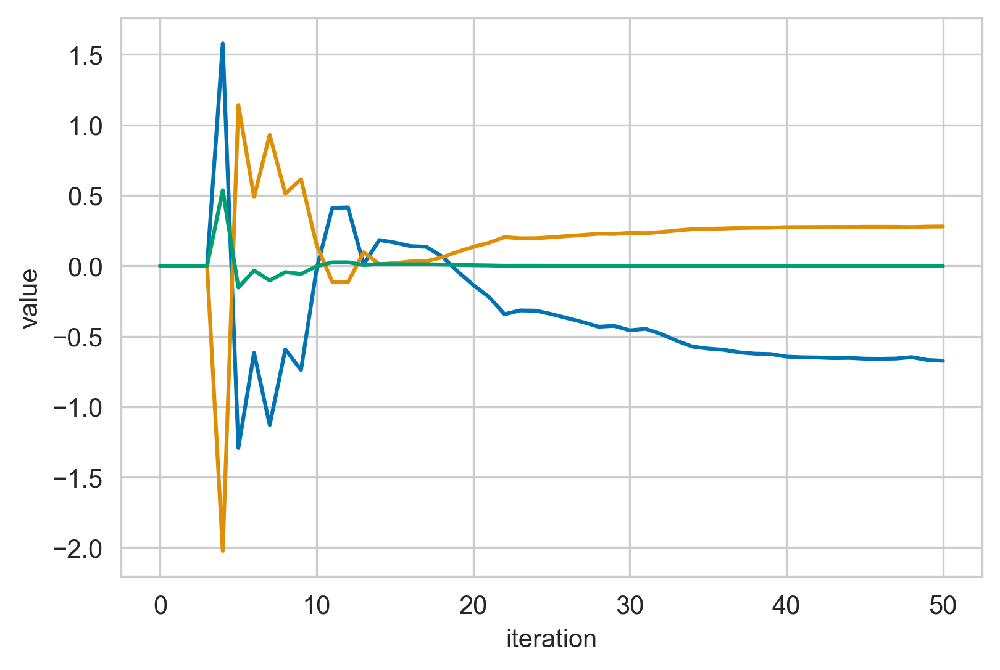

In [45]:
plt.xlabel('iteration')
plt.ylabel('value')
plt.plot(mus[0], label='bias')
plt.plot(mus[1], label='linear feature weight')
plt.plot(mus[2], label='square feature weight');

In [46]:
print(mus[0][-1], mus[1][-1], mus[2][-1])

-0.6736909913684741 0.2792542638510014 -0.0018293238786964705


In [47]:
print(sigmas[-1])

[[ 1.26419356e-02 -1.00117689e-03  1.65210628e-05]
 [-1.00117689e-03  1.03452064e-04 -1.90657989e-06]
 [ 1.65210628e-05 -1.90657989e-06  3.73859849e-08]]


In [48]:
posterior_mu = np.array([mus[0][-1], mus[1][-1], mus[2][-1]])
posterior_sigma = sigmas[-1]

### c.

Посэмплируем!

In [49]:
def myplot_sample_lines_new(mu, sigma, n=20, points=None, scale='log'):
    # Посэмплируем и порисуем прямые
    my_w = np.random.multivariate_normal(mu, sigma, n)
    new_days = np.arange(0, len(data['date'][:220]), 1)

    # plt.axis('equal')
    if scale == 'log':
        for w in my_w:
            plt.semilogy(data['date'][:220], np.exp(w[0] + w[1]*new_days + w[2] * (new_days) ** 2), 'k-', lw=.4)
    else:
        for w in my_w:
            plt.plot(data['date'][:220], np.exp(w[0] + w[1]*new_days + w[2] * (new_days) ** 2), 'k-', lw=.4)
    #plt.ylim((-3, 3))
    #plt.xlim((-3, 3))
    if not points is None:
        plt.scatter(points[0], points[1], marker='*', s=200)

In [50]:
def myplot_sample_lines_total(mu, sigma, n=20, points=None, scale='log'):
    # Посэмплируем и порисуем прямые
    my_w = np.random.multivariate_normal(mu, sigma, n)
    new_days = np.arange(0, len(data['date'][:220]), 1)

    # plt.axis('equal')
    if scale == 'log':
        for w in my_w:
            plt.semilogy(data['date'][:220], np.cumsum(np.exp(w[0] + w[1]*new_days + w[2] * (new_days) ** 2)), 'k-', lw=.4)
    else:
        for w in my_w:
            plt.plot(data['date'][:220], np.cumsum(np.exp(w[0] + w[1]*new_days + w[2] * (new_days) ** 2)), 'k-', lw=.4)
    #plt.ylim((-3, 3))
    #plt.xlim((-3, 3))
    if not points is None:
        plt.scatter(points[0], points[1], marker='*', s=200)

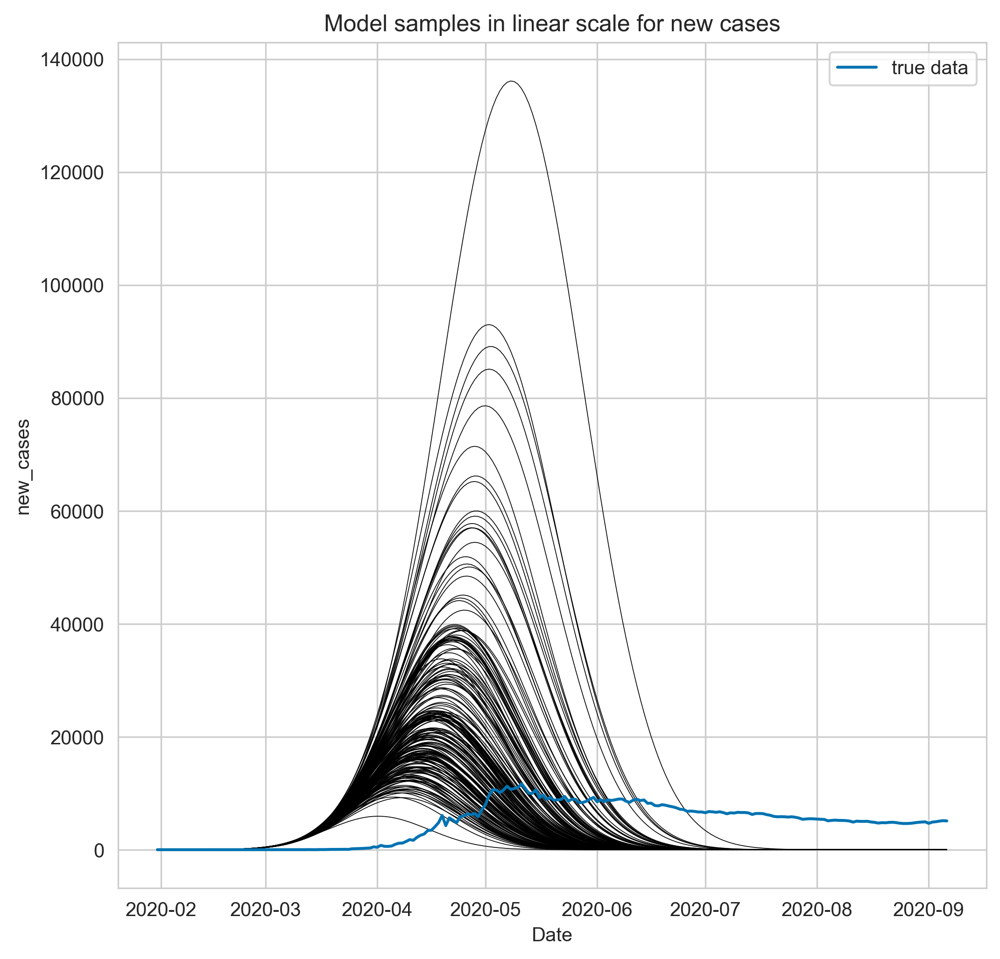

In [51]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines_new(posterior_mu, posterior_sigma, 200, scale='linear')
plt.plot(data['date'][:220], data['new_cases'][:220], label='true data')
plt.legend()
plt.xlabel('Date')
plt.ylabel('new_cases')
plt.title('Model samples in linear scale for new cases');

Хмм, интересно. Давайте посмотрим на число всех случаев, которые получим, взяв кумулятивную сумму предсказаний новых случаев.


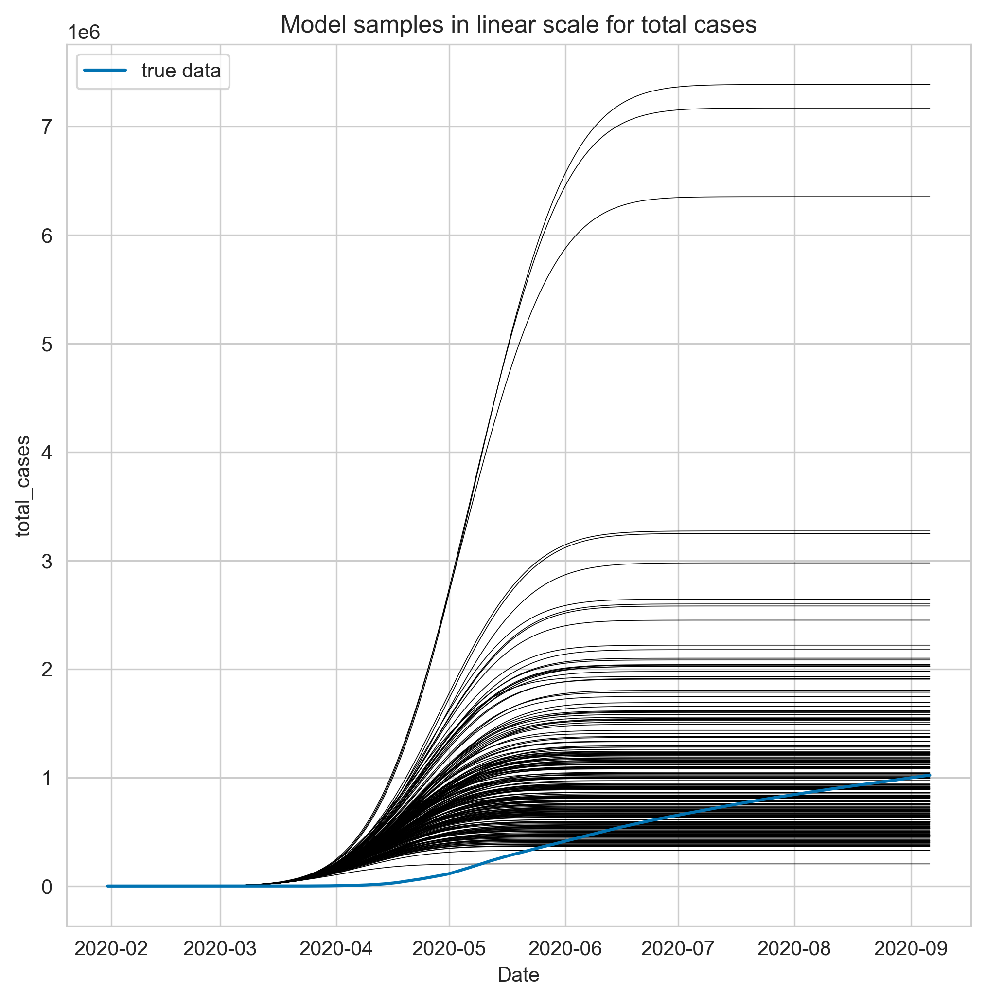

In [52]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines_total(posterior_mu, posterior_sigma, 200, scale='linear')
plt.plot(data['date'][:220], data['total_cases'][:220], label='true data')
plt.legend()
plt.xlabel('Date')
plt.ylabel('total_cases')
plt.title('Model samples in linear scale for total cases');

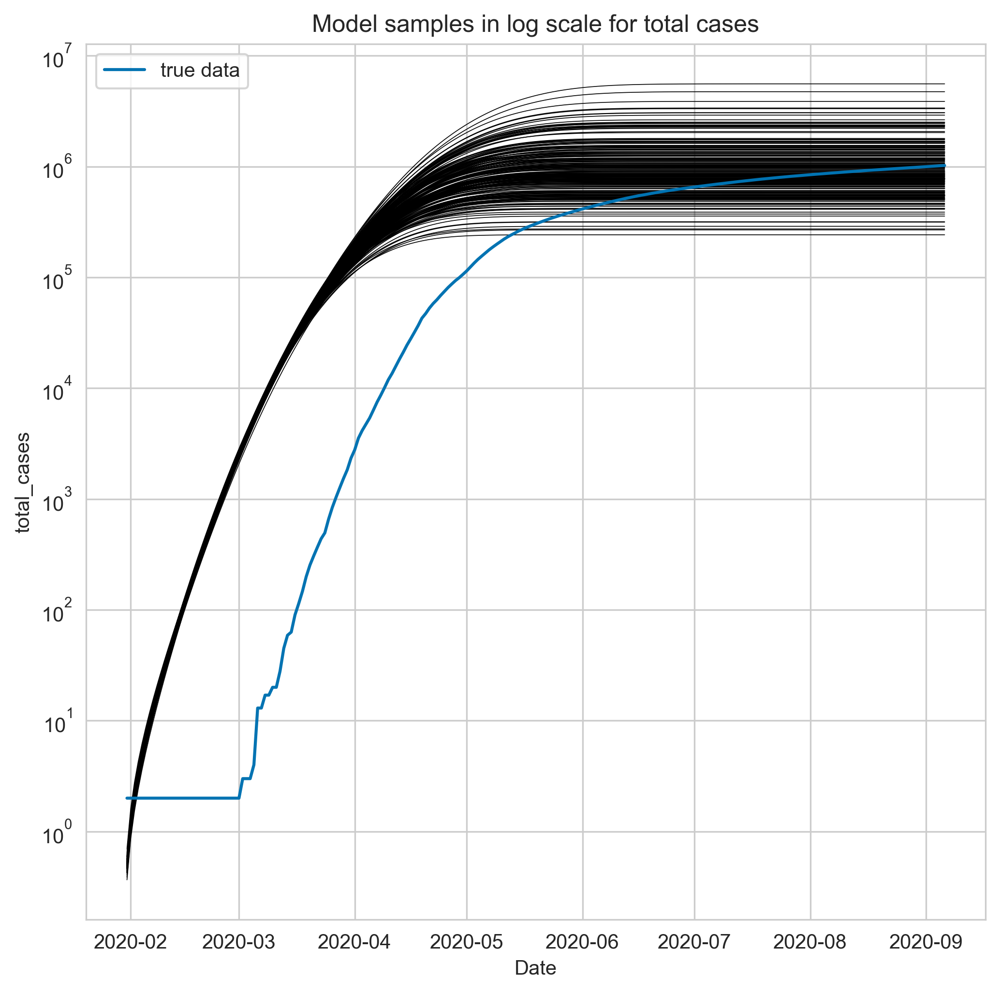

In [53]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines_total(posterior_mu, posterior_sigma, 200, scale='log')
plt.plot(data['date'][:220], data['total_cases'][:220], label='true data')
plt.legend()
plt.xlabel('Date')
plt.ylabel('total_cases')
plt.title('Model samples in log scale for total cases');

Новые предсказания основанные на пробит модели гораздо лучше предсказаний простой экспоненциальной модели. 

In [54]:
def sample_probit_statistics(mu, sigma, xs, n=200):
    my_w = np.random.multivariate_normal(mu, sigma, n)
    res = np.zeros((n, xs.shape[0]))
    for i,w in enumerate(my_w):
        res[i,:] = w[0] + w[1] * xs + w[2] * (xs ** 2)
    return res

In [55]:
# Нарисуем результат
def plot_probit_predictions(xs, mu, x):
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    ax.set_xlim((xs[0], xs[-1]))
    #ax.set_ylim((-2, 2))
    ax.plot(xs, y_true, label="Правильный ответ")
    ax.plot(xs, np.cumsum(np.exp(mu[2] * (xs **2) + mu[1]*xs + mu[0])), color="red", label="MAP гипотеза")
    ax.fill_between(xs, np.cumsum(np.exp(mu[2] * (xs**2) + mu[1]*xs + mu[0] - sigma_new)),
                    np.cumsum(np.exp(mu[2] * (xs **2) + mu[1]*xs + mu[0] + sigma_new)), color=palette[1], alpha=.2, label="+- дисперсия шума")
    ax.fill_between(xs, np.cumsum(np.exp(np.mean(x, axis=0) - np.std(x, axis=0))), np.cumsum(np.exp(np.mean(x, axis=0) + np.std(x, axis=0))), color=palette[5], alpha=.3, label="дисперсия предсказаний")
    #ax.scatter(points[0], points[1], marker='*', s=200)
    ax.legend()

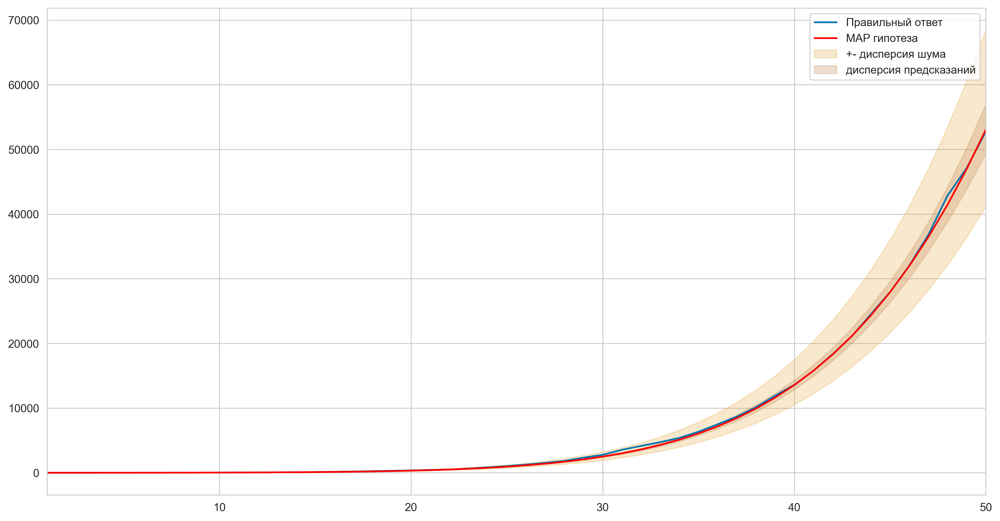

In [56]:
x = sample_probit_statistics(posterior_mu, posterior_sigma, days.flatten(), n=100)
plot_probit_predictions(days.flatten(), cur_mu, x)

In [57]:
total_x = sample_probit_statistics(posterior_mu, posterior_sigma, np.arange(len(data)), n=100)

In [58]:
empirical_distribution = np.cumsum(np.exp(total_x), axis=1)

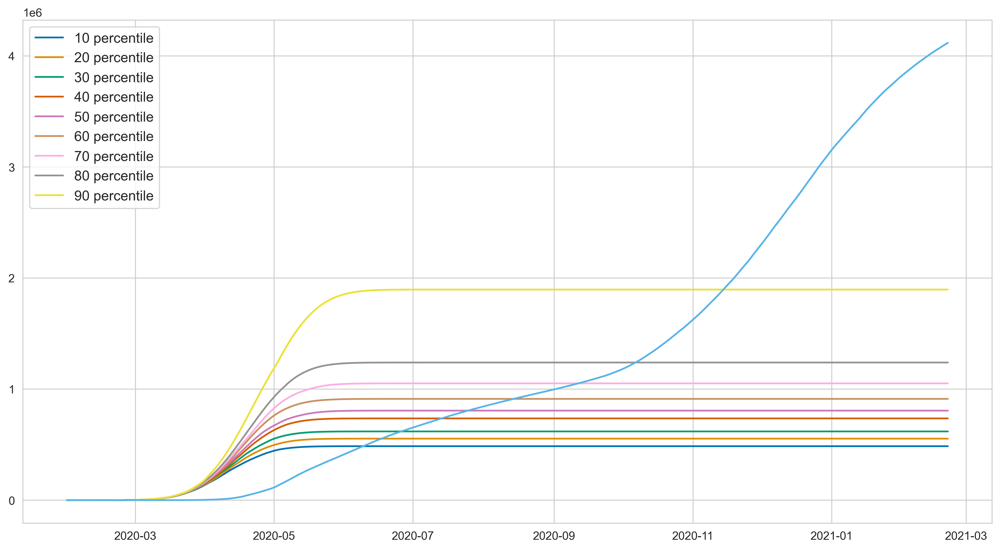

In [59]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
for percentile in np.arange(10, 100, 10):
    ax.plot(data['date'], np.percentile(empirical_distribution, percentile, axis=0), label=f'{percentile} percentile')
    
ax.plot(data['date'], data['total_cases'])
ax.legend(fontsize=12);

Можно заметить, что согласно нашему предсказательному распределению насыщение произойдет в мае, в начале либо в конце в соответствии с оптимистичностью предсказания. Можно заметить что основная плотность (60%) сконцентрирована на отрезке от 0.5 до 1 миллиона заболевших. Самые оптимистичные предсказания говорят о насыщении в начале мая в полумиллионе заболевших, самые пессимистичные -- в конце мая с почти 1.75 миллионами заболевших.

## Китай.

In [74]:
data = pd.read_csv('owid-covid-data.csv')
data = data[data['location'] == 'China']
data['date'] = pd.to_datetime(data['date'])
a = data.new_cases.values
data['new_cases'].fillna(1, inplace=True)
data['new_cases'] = np.where(a <= 0, 1, a).tolist()

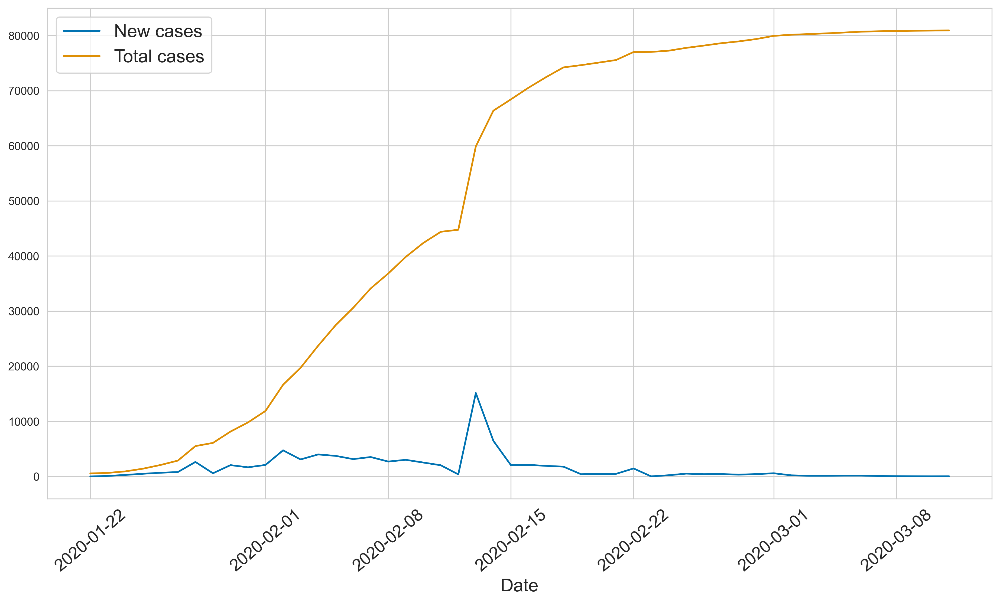

In [75]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
ax.plot(data.date[:50], data.new_cases[:50], label='New cases')
ax.plot(data.date[:50], data.total_cases[:50], label='Total cases')
ax.legend(fontsize=legend_fontsize)
ax.set_xlabel('Date', fontsize=legend_fontsize)
ax.xaxis.set_tick_params(labelsize=15, labelrotation=40)

Возьмем за начальную дату эпидемии 01.22.2020. В качестве априорного распределения по прежнему возьмем нулевое среднее и дисперсию 25.

In [76]:
days = np.arange(1, 51, 1).reshape(-1, 1)
days_sq = np.hstack((days**2, days, np.ones(days.shape)))
y_new = data.new_cases.values[:50]

In [77]:
hyperparameter_estimation = minimize(lnpd, 10, (25, days_sq, np.log(y_new)), bounds = [(0.0001, None)])

In [78]:
print(hyperparameter_estimation)

      fun: 46.178899702856
 hess_inv: <1x1 LbfgsInvHessProduct with dtype=float64>
      jac: array([2.13162822e-06])
  message: b'CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL'
     nfev: 28
      nit: 5
     njev: 14
   status: 0
  success: True
        x: array([1.43322186])


In [79]:
sigma_new = hyperparameter_estimation.x[0]
print(sigma_new)

1.433221863676874


Text(0, 0.5, '$\\log p(D|alpha,beta)$')

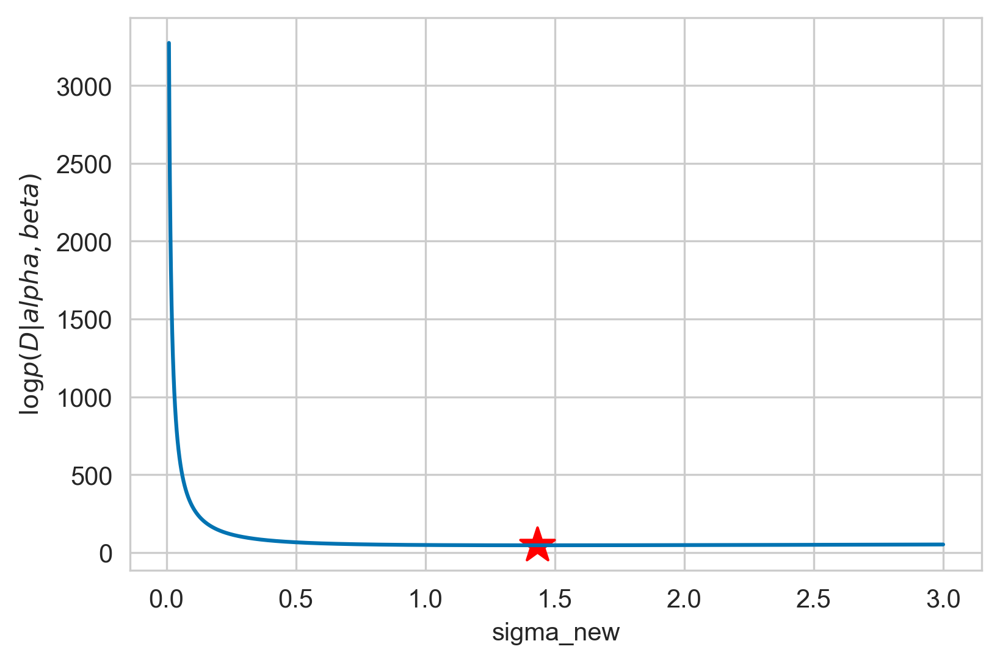

In [80]:
a = np.linspace(0.01, 3, 10000)
b = np.array(list(map(lambda x: lnpd(x, 25, days_sq, np.log(y_new)), a)))
plt.scatter(sigma_new, lnpd(sigma_new, 25, days_sq, np.log(y_new)), marker='*', c='r', s=200)
plt.plot(a, b)
plt.xlabel('sigma_new')
plt.ylabel('$\log p(D|alpha,beta)$')

In [81]:
cur_mu, cur_sigma = np.array([0, 0, 0]), 25 * np.eye(3)
mus, sigmas = [cur_mu], [cur_sigma]
for day, total in zip(np.arange(1, 51, 1), y_new):
    cur_mu, cur_sigma = bayesian_update_sq(cur_mu, cur_sigma, day, np.log(total), sigma_noise=sigma_new)
    mus.append(cur_mu)
    sigmas.append(cur_sigma)
mus = list(zip(*mus))

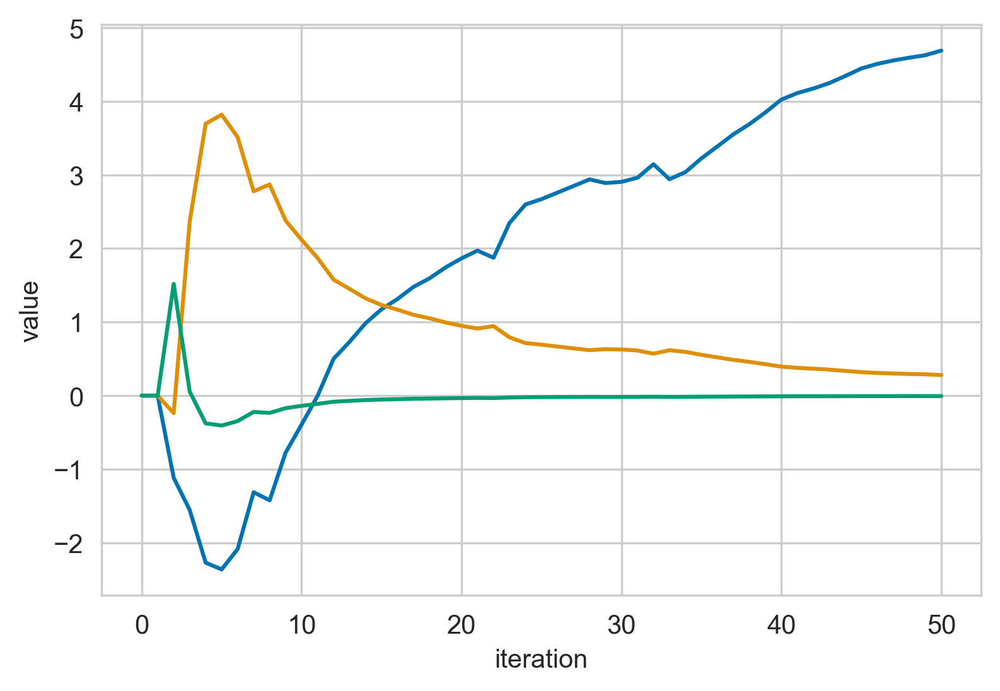

In [82]:
plt.xlabel('iteration')
plt.ylabel('value')
plt.plot(mus[0], label='bias')
plt.plot(mus[1], label='linear feature weight')
plt.plot(mus[2], label='square feature weight');

In [83]:
print(mus[0][-1], mus[1][-1], mus[2][-1])
print(sigmas[-1])
posterior_mu = np.array([mus[0][-1], mus[1][-1], mus[2][-1]])
posterior_sigma = sigmas[-1]

4.689124762369346 0.27946623761368894 -0.0064083469375696145
[[ 3.94604818e-01 -3.12497634e-02  5.15664756e-04]
 [-3.12497634e-02  3.24076177e-03 -5.98000104e-05]
 [ 5.15664756e-04 -5.98000104e-05  1.17459303e-06]]


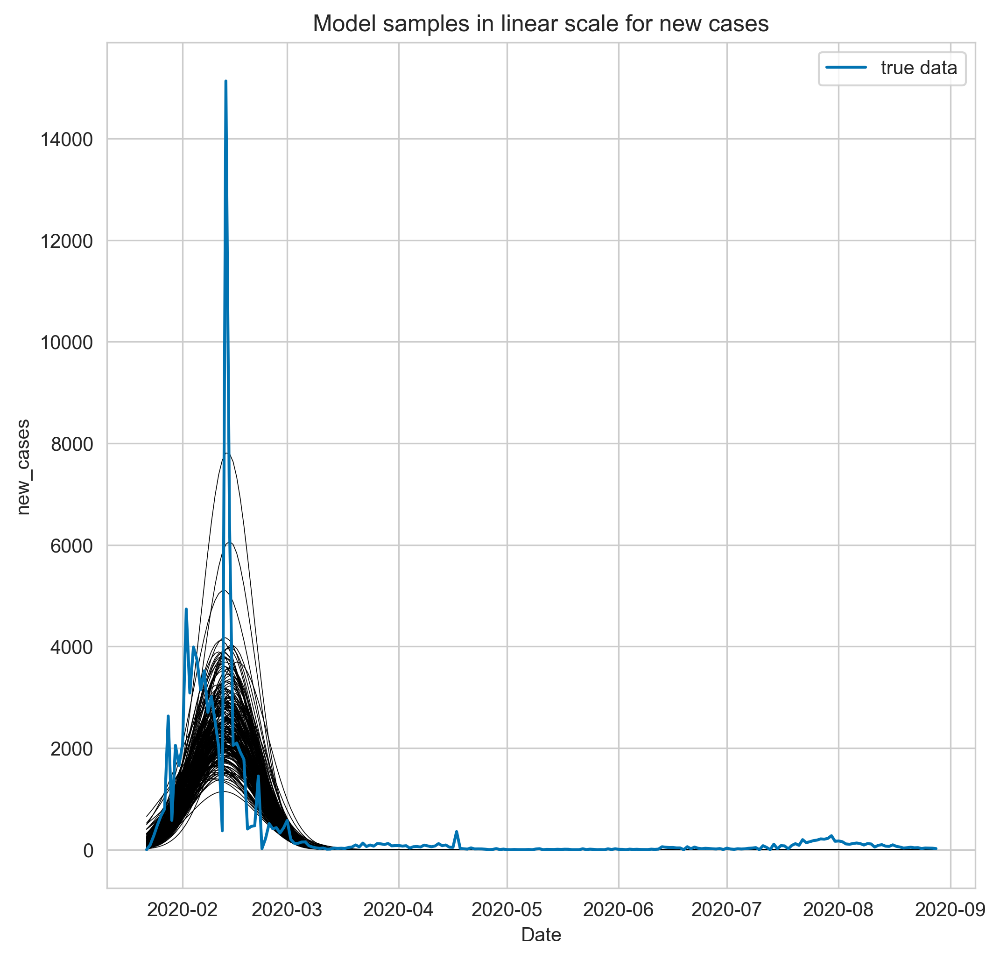

In [85]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines_new(posterior_mu, posterior_sigma, 200, scale='linear')
plt.plot(data['date'][:220], data['new_cases'][:220], label='true data')
plt.legend()
plt.xlabel('Date')
plt.ylabel('new_cases')
plt.title('Model samples in linear scale for new cases');

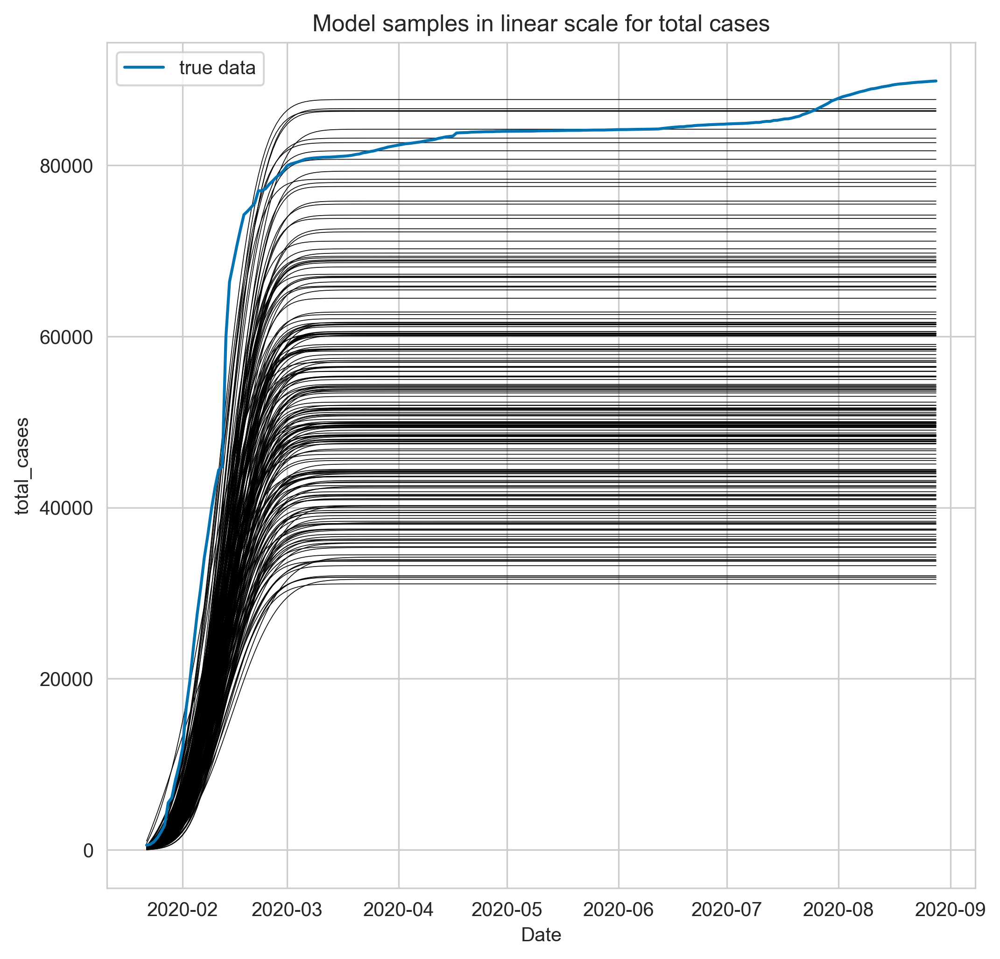

In [86]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines_total(posterior_mu, posterior_sigma, 200, scale='linear')
plt.plot(data['date'][:220], data['total_cases'][:220], label='true data')
plt.legend()
plt.xlabel('Date')
plt.ylabel('total_cases')
plt.title('Model samples in linear scale for total cases');

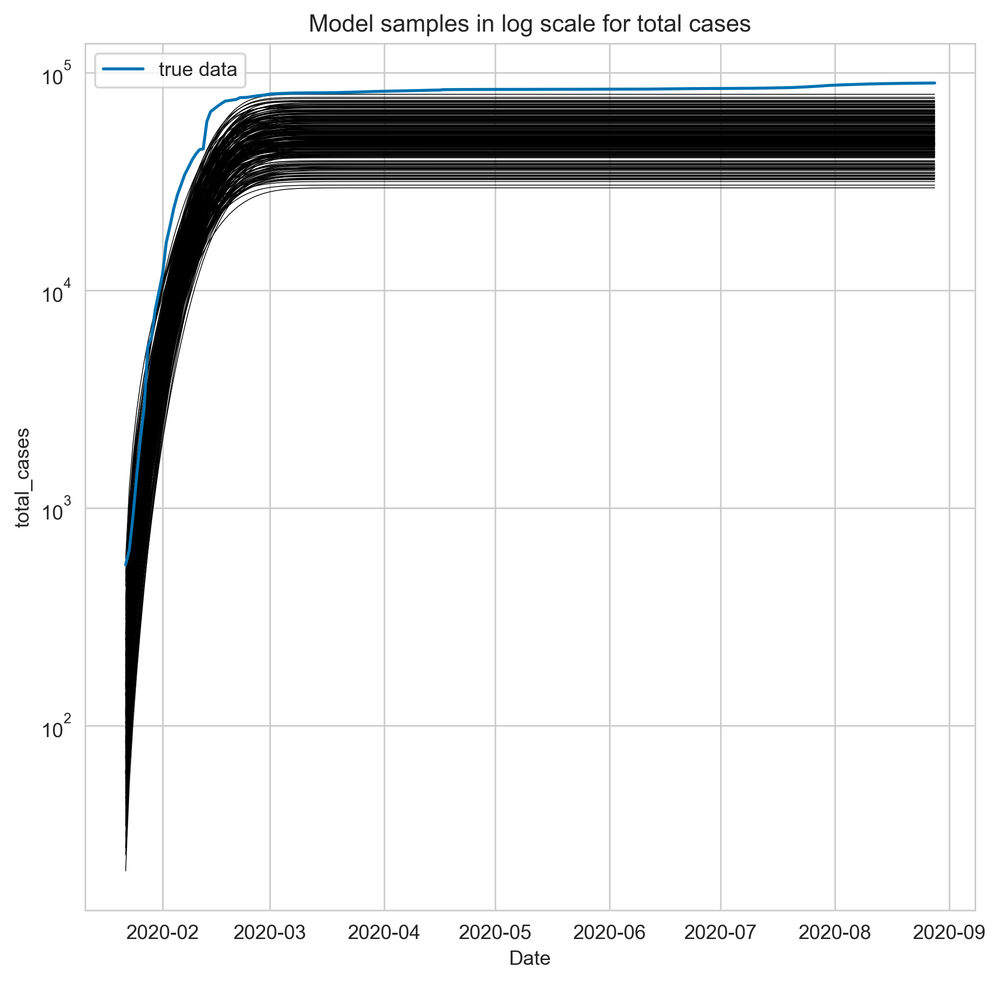

In [87]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines_total(posterior_mu, posterior_sigma, 200, scale='log')
plt.plot(data['date'][:220], data['total_cases'][:220], label='true data')
plt.legend()
plt.xlabel('Date')
plt.ylabel('total_cases')
plt.title('Model samples in log scale for total cases');

In [88]:
# Нарисуем результат
def plot_probit_predictions(xs, mu, x):
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    ax.set_xlim((xs[0], xs[-1]))
    #ax.set_ylim((-2, 2))
    ax.plot(xs, np.cumsum(y_new), label="Правильный ответ")
    ax.plot(xs, np.cumsum(np.exp(mu[2] * (xs **2) + mu[1]*xs + mu[0])), color="red", label="MAP гипотеза")
    ax.fill_between(xs, np.cumsum(np.exp(mu[2] * (xs**2) + mu[1]*xs + mu[0] - sigma_new)),
                    np.cumsum(np.exp(mu[2] * (xs **2) + mu[1]*xs + mu[0] + sigma_new)), color=palette[1], alpha=.2, label="+- дисперсия шума")
    ax.fill_between(xs, np.cumsum(np.exp(np.mean(x, axis=0) - np.std(x, axis=0))), np.cumsum(np.exp(np.mean(x, axis=0) + np.std(x, axis=0))), color=palette[5], alpha=.3, label="дисперсия предсказаний")
    #ax.scatter(points[0], points[1], marker='*', s=200)
    ax.legend()

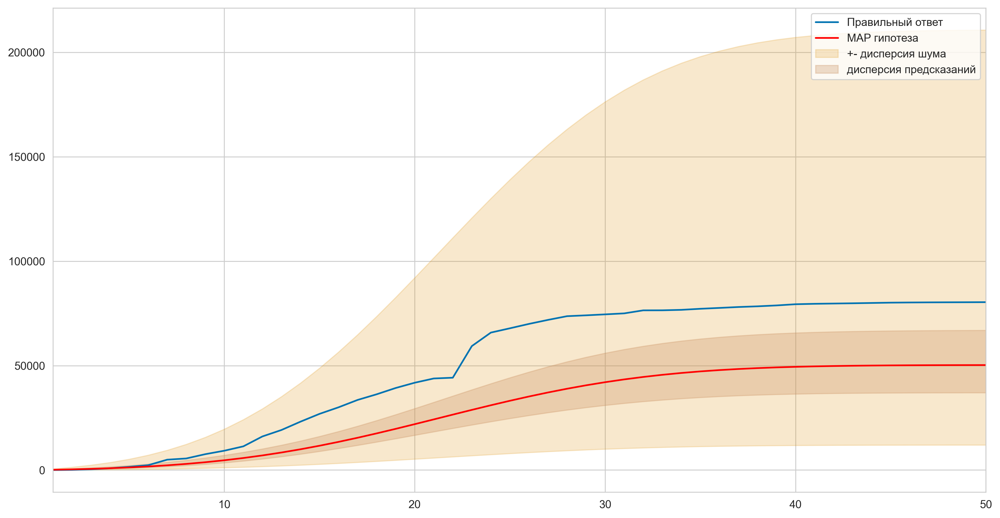

In [89]:
x = sample_probit_statistics(posterior_mu, posterior_sigma, days.flatten(), n=100)
plot_probit_predictions(days.flatten(), cur_mu, x)

In [90]:
total_x = sample_probit_statistics(posterior_mu, posterior_sigma, np.arange(len(data)), n=100)

In [91]:
empirical_distribution = np.cumsum(np.exp(total_x), axis=1)

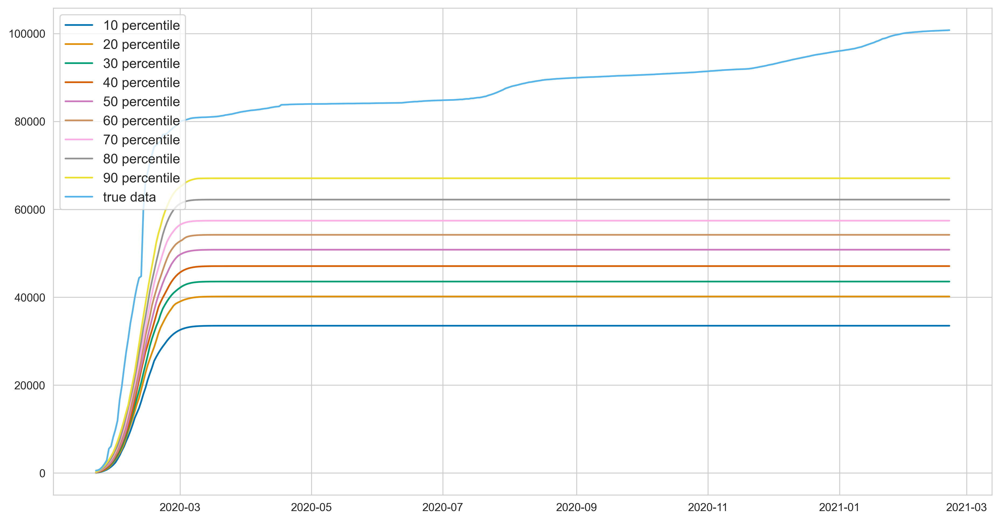

In [92]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
for percentile in np.arange(10, 100, 10):
    ax.plot(data['date'], np.percentile(empirical_distribution, percentile, axis=0), label=f'{percentile} percentile')
    
ax.plot(data['date'], data['total_cases'], label='true data')
ax.legend(fontsize=12);

## Япония.

In [60]:
data = pd.read_csv('owid-covid-data.csv')

In [96]:
data = pd.read_csv('owid-covid-data.csv')
data = data[data['location'] == 'Japan']
data['date'] = pd.to_datetime(data['date'])
a = data.new_cases.values
#data.loc[data['new_cases'].isnull(),'total_cases'] = data[data['new_cases'].isnull()]['total_cases'] + 1
data['new_cases'].fillna(1, inplace=True)
data['new_cases'] = np.where(a <= 0, 1, a).tolist()
data['total_cases'] = np.cumsum(data['new_cases'].values)

In [97]:
data.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
32259,JPN,Asia,Japan,2020-01-22,1.0,1.0,NaN,NaN,NaN,NaN,...,39002.223,NaN,79.37,5.72,11.2,33.7,NaN,13.05,84.63,0.919
32260,JPN,Asia,Japan,2020-01-23,2.0,1.0,NaN,NaN,NaN,NaN,...,39002.223,NaN,79.37,5.72,11.2,33.7,NaN,13.05,84.63,0.919
32261,JPN,Asia,Japan,2020-01-24,3.0,1.0,NaN,NaN,NaN,NaN,...,39002.223,NaN,79.37,5.72,11.2,33.7,NaN,13.05,84.63,0.919
32262,JPN,Asia,Japan,2020-01-25,4.0,1.0,NaN,NaN,NaN,NaN,...,39002.223,NaN,79.37,5.72,11.2,33.7,NaN,13.05,84.63,0.919
32263,JPN,Asia,Japan,2020-01-26,6.0,2.0,NaN,NaN,NaN,NaN,...,39002.223,NaN,79.37,5.72,11.2,33.7,NaN,13.05,84.63,0.919


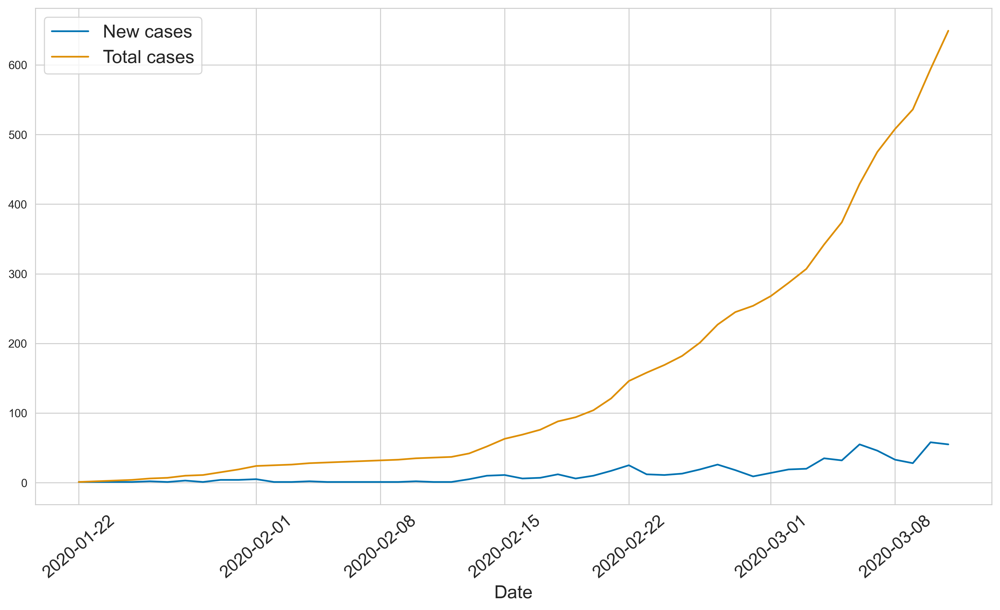

In [98]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
ax.plot(data.date[:50], data.new_cases[:50], label='New cases')
ax.plot(data.date[:50], data.total_cases[:50], label='Total cases')
ax.legend(fontsize=legend_fontsize)
ax.set_xlabel('Date', fontsize=legend_fontsize)
ax.xaxis.set_tick_params(labelsize=15, labelrotation=40)

In [99]:
days = np.arange(1, 51, 1).reshape(-1, 1)
days_sq = np.hstack((days**2, days, np.ones(days.shape)))
y_new = data.new_cases.values[:50]

In [100]:
hyperparameter_estimation = minimize(lnpd, 10, (25, days_sq, np.log(y_new)), bounds = [(0.0001, None)])

In [101]:
print(hyperparameter_estimation)

      fun: 15.089610394408593
 hess_inv: <1x1 LbfgsInvHessProduct with dtype=float64>
      jac: array([-3.55271368e-07])
  message: b'CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL'
     nfev: 30
      nit: 7
     njev: 15
   status: 0
  success: True
        x: array([0.38917592])


0.38917591626670345


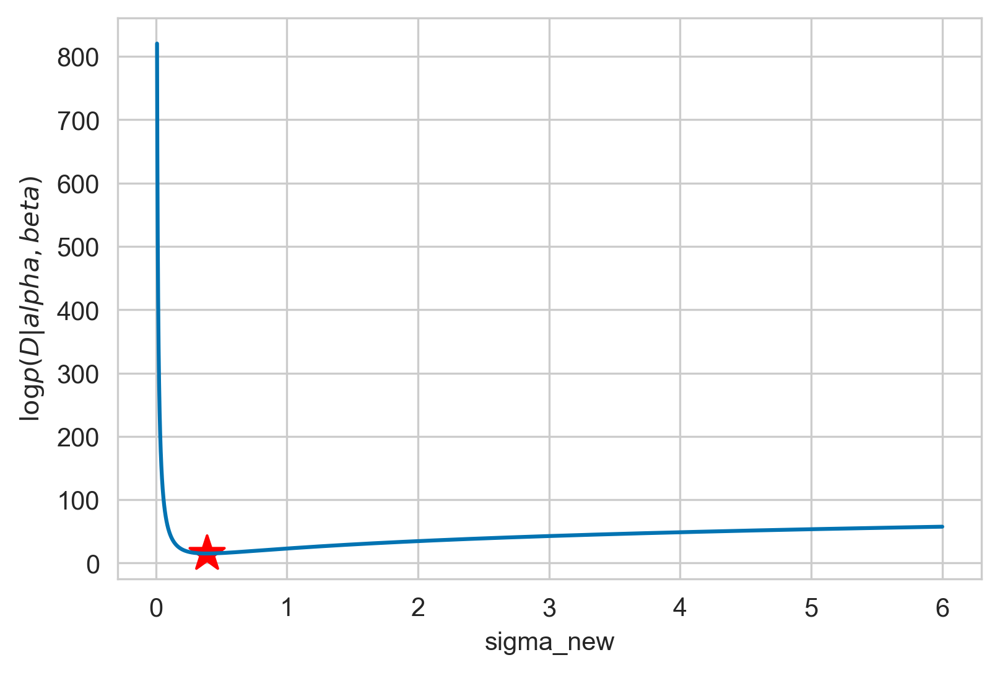

In [102]:
sigma_new = hyperparameter_estimation.x[0]
print(sigma_new)
a = np.linspace(0.01, 6, 10000)
b = np.array(list(map(lambda x: lnpd(x, 25, days_sq, np.log(y_new)), a)))
plt.scatter(sigma_new, lnpd(sigma_new, 25, days_sq, np.log(y_new)), marker='*', c='r', s=200)
plt.plot(a, b)
plt.xlabel('sigma_new')
plt.ylabel('$\log p(D|alpha,beta)$');

In [103]:
cur_mu, cur_sigma = np.array([0, 0, 0]), 25 * np.eye(3)
mus, sigmas = [cur_mu], [cur_sigma]
for day, total in zip(np.arange(1, 511, 1), y_new):
    cur_mu, cur_sigma = bayesian_update_sq(cur_mu, cur_sigma, day, np.log(total), sigma_noise=sigma_new)
    mus.append(cur_mu)
    sigmas.append(cur_sigma)
mus = list(zip(*mus))

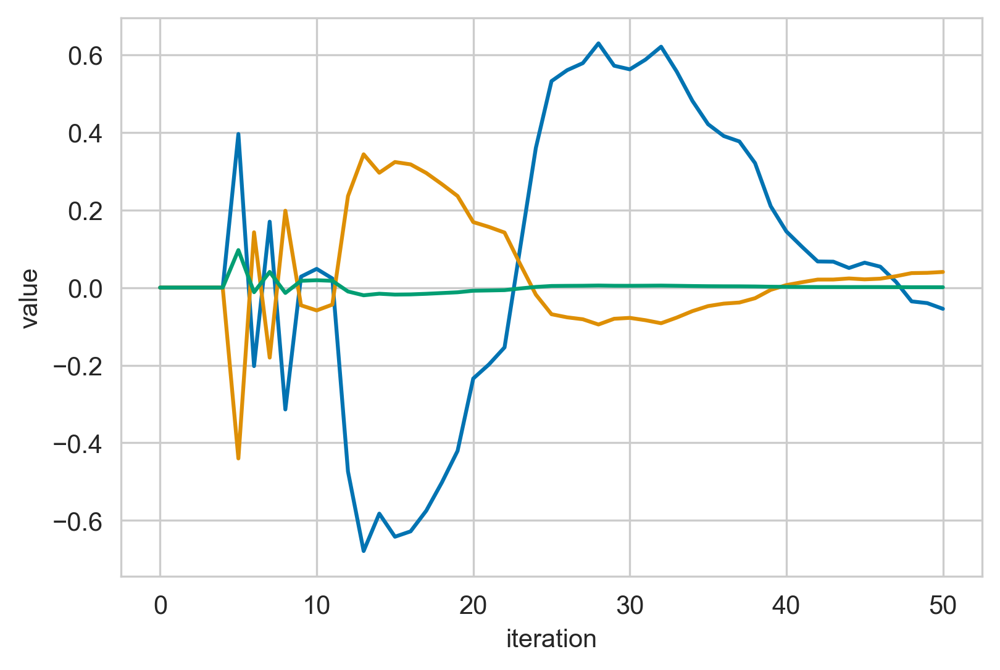

In [104]:
plt.xlabel('iteration')
plt.ylabel('value')
plt.plot(mus[0], label='bias')
plt.plot(mus[1], label='linear feature weight')
plt.plot(mus[2], label='square feature weight');

In [105]:
print(mus[0][-1], mus[1][-1], mus[2][-1])
print(sigmas[-1])
posterior_mu = np.array([mus[0][-1], mus[1][-1], mus[2][-1]])
posterior_sigma = sigmas[-1]

-0.054742063992691214 0.04027728527691998 0.0009014225599760783
[[ 2.95300575e-02 -2.33862708e-03  3.85911623e-05]
 [-2.33862708e-03  2.41689575e-04 -4.45448308e-06]
 [ 3.85911623e-05 -4.45448308e-06  8.73540831e-08]]


In [106]:
new_days = np.arange(0, len(data['date'][:220]), 1)
print(new_days)
my_w = np.random.multivariate_normal(posterior_mu, posterior_sigma, 200)
w = my_w[0]
print(w)
print(w[0] + w[1]*new_days + w[2] * (new_days) ** 2)

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219]
[-0.13171658  0.05311644  0.00060104]
[-1.31716576e-01 -7.79990936e-02 -2.30795340e-02  3.30421026e-02
  9

In [107]:
def myplot_sample_lines_new(mu, sigma, n=20, points=None, scale='log'):
    # Посэмплируем и порисуем прямые
    my_w = np.random.multivariate_normal(mu, sigma, n)
    new_days = np.arange(0, len(data['date'][:220]), 1)

    # plt.axis('equal')
    if scale == 'log':
        for w in my_w:
            plt.semilogy(data['date'][:220], np.exp(w[0] + w[1]*new_days + w[2] * (new_days) ** 2), 'k-', lw=.4)
    else:
        for w in my_w:
            plt.plot(data['date'][:220], np.exp(w[0] + w[1]*new_days + w[2] * (new_days) ** 2), 'k-', lw=.4)
    #plt.ylim((-3, 3))
    #plt.xlim((-3, 3))
    if not points is None:
        plt.scatter(points[0], points[1], marker='*', s=200)

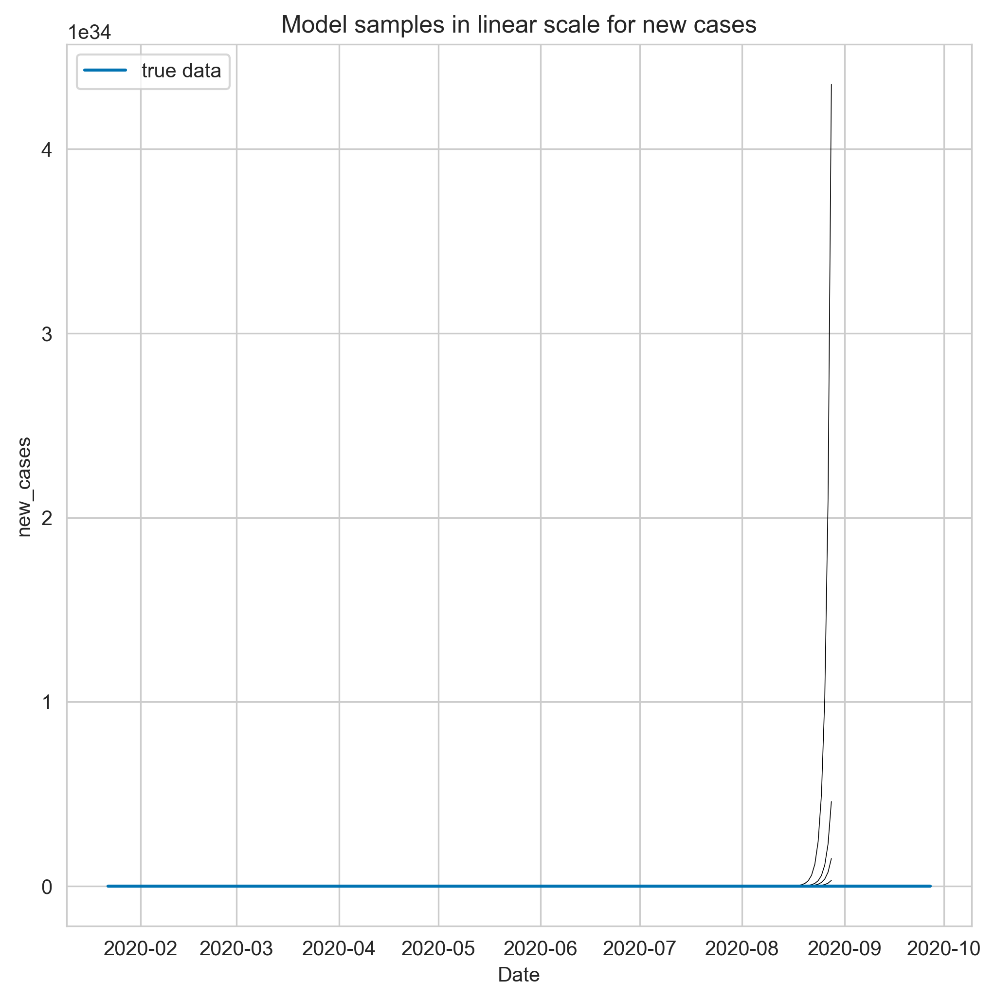

In [108]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines_new(posterior_mu, posterior_sigma, 100, scale='linear')
plt.plot(data['date'][:250], data['new_cases'][:250], label='true data')
plt.legend()
plt.xlabel('Date')
plt.ylabel('new_cases')
plt.title('Model samples in linear scale for new cases');

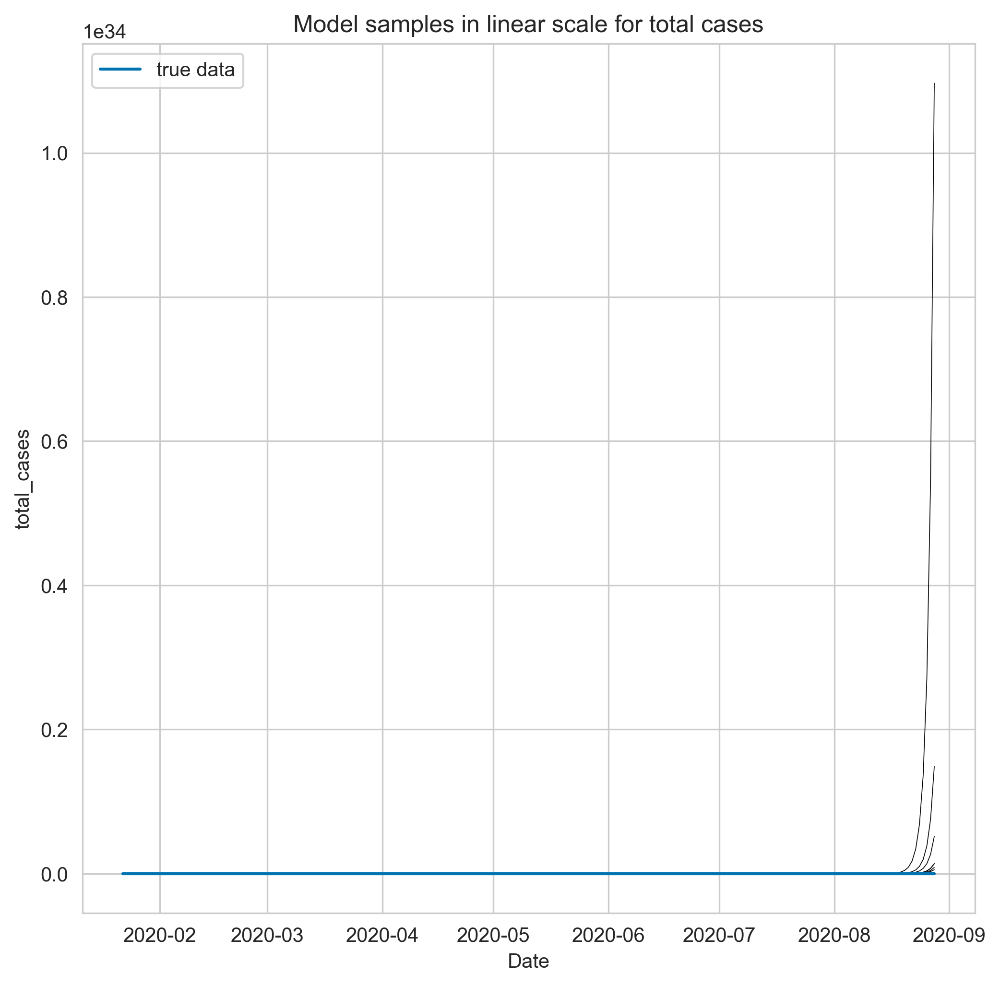

In [109]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines_total(posterior_mu, posterior_sigma, 200, scale='linear')
plt.plot(data['date'][:220], data['total_cases'][:220], label='true data')
plt.legend()
plt.xlabel('Date')
plt.ylabel('total_cases')
plt.title('Model samples in linear scale for total cases');

По непонятной для меня причине, третий коэффициент регрессии (который перед квадратичным признаком) выучивается неотрицательным. Соответственно, на больших иксах он с легкостью перебивает остальные признаки и устремляется очень далеко, не показывает пробит свойства. На данных из России и Китая так не происходило. Я не смог разобраться в причине :(

## Германия.

In [146]:
data = pd.read_csv('owid-covid-data.csv')
data = data[data['location'] == 'Germany']
data['date'] = pd.to_datetime(data['date'])
a = data.new_cases.values
data['new_cases'].fillna(1, inplace=True)
data['new_cases'] = np.where(a <= 0, 1, a).tolist()

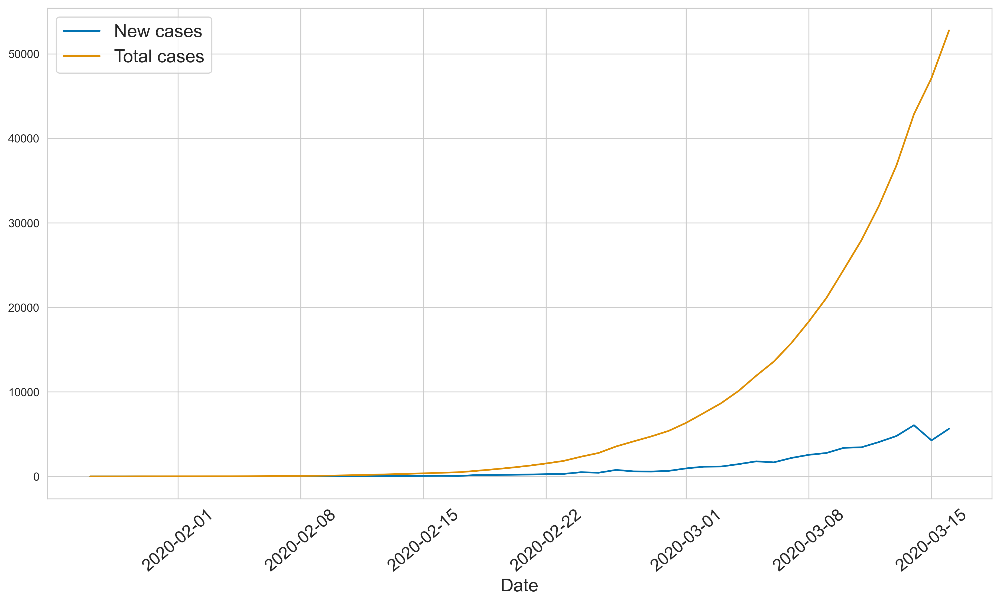

In [147]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
ax.plot(data.date[:50], train_data.new_cases[:50], label='New cases')
ax.plot(data.date[:50], train_data.total_cases[:50], label='Total cases')
ax.plot
ax.legend(fontsize=legend_fontsize)
ax.set_xlabel('Date', fontsize=legend_fontsize)
ax.xaxis.set_tick_params(labelsize=15, labelrotation=40)

In [148]:
days = np.arange(1, 51, 1).reshape(-1, 1)
days_sq = np.hstack((days**2, days, np.ones(days.shape)))
y_new = data.new_cases.values[:50]

In [150]:
hyperparameter_estimation = minimize(lnpd, 10, (25, days_sq, np.log(y_new)), bounds = [(0.0001, None)])
print(hyperparameter_estimation)
sigma_new = hyperparameter_estimation.x[0]
print(sigma_new)

      fun: 22.8739228982382
 hess_inv: <1x1 LbfgsInvHessProduct with dtype=float64>
      jac: array([-7.10542732e-07])
  message: b'CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL'
     nfev: 38
      nit: 10
     njev: 19
   status: 0
  success: True
        x: array([0.54151427])
0.5415142741107875


Text(0, 0.5, '$\\log p(D|alpha,beta)$')

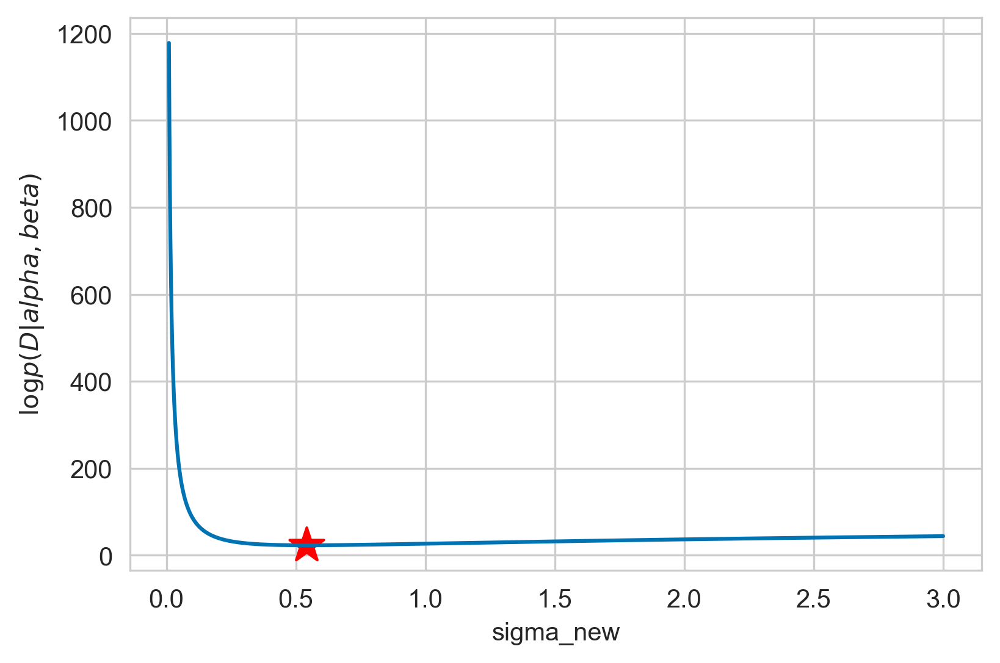

In [151]:
a = np.linspace(0.01, 3, 10000)
b = np.array(list(map(lambda x: lnpd(x, 25, days_sq, np.log(y_new)), a)))
plt.scatter(sigma_new, lnpd(sigma_new, 25, days_sq, np.log(y_new)), marker='*', c='r', s=200)
plt.plot(a, b)
plt.xlabel('sigma_new')
plt.ylabel('$\log p(D|alpha,beta)$')

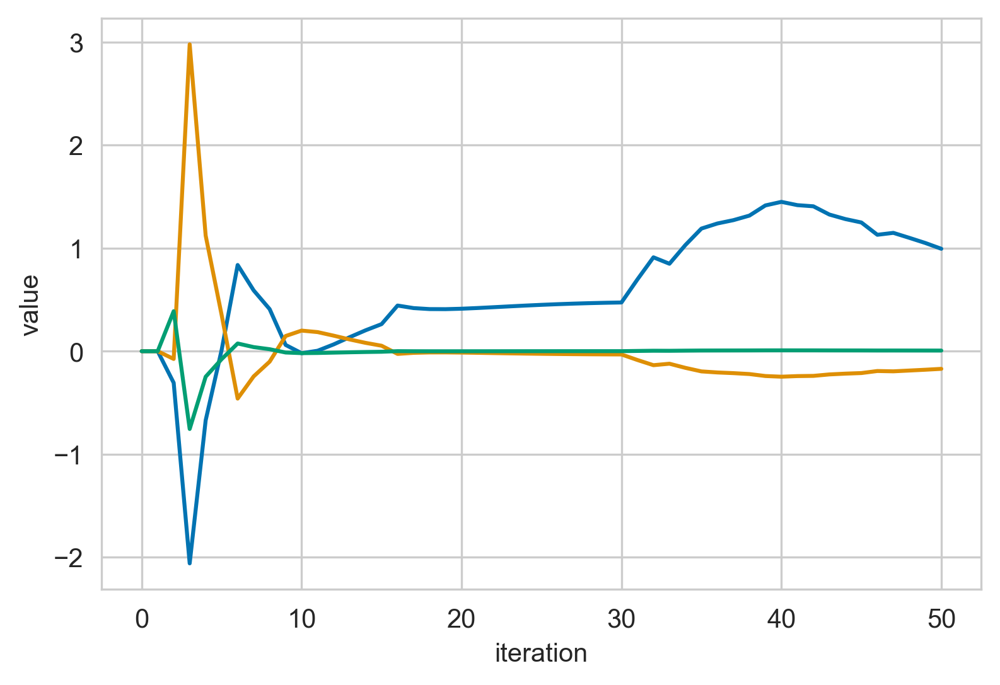

In [152]:
cur_mu, cur_sigma = np.array([0, 0, 0]), 25 * np.eye(3)
mus, sigmas = [cur_mu], [cur_sigma]
for day, total in zip(np.arange(1, 51, 1), y_new):
    cur_mu, cur_sigma = bayesian_update_sq(cur_mu, cur_sigma, day, np.log(total), sigma_noise=sigma_new)
    mus.append(cur_mu)
    sigmas.append(cur_sigma)
mus = list(zip(*mus))

plt.xlabel('iteration')
plt.ylabel('value')
plt.plot(mus[0], label='bias')
plt.plot(mus[1], label='linear feature weight')
plt.plot(mus[2], label='square feature weight');

In [153]:
print(mus[0][-1], mus[1][-1], mus[2][-1])
print(sigmas[-1])
posterior_mu = np.array([mus[0][-1], mus[1][-1], mus[2][-1]])
posterior_sigma = sigmas[-1]

0.9940000006870093 -0.17117219903492664 0.006258400422713292
[[ 5.71096165e-02 -4.52277524e-03  7.46330914e-05]
 [-4.52277524e-03  4.67535034e-04 -8.61771361e-06]
 [ 7.46330914e-05 -8.61771361e-06  1.69017003e-07]]


In [154]:
new_days = np.arange(0, len(data['date'][:220]), 1)
print(new_days)
my_w = np.random.multivariate_normal(posterior_mu, posterior_sigma, 200)
w = my_w[0]
print(w)
print(w[0] + w[1]*new_days + w[2] * (new_days) ** 2)

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219]
[ 0.82679427 -0.16484231  0.00620133]
[ 8.26794268e-01  6.68153288e-01  5.21914963e-01  3.88079293e-01
  2

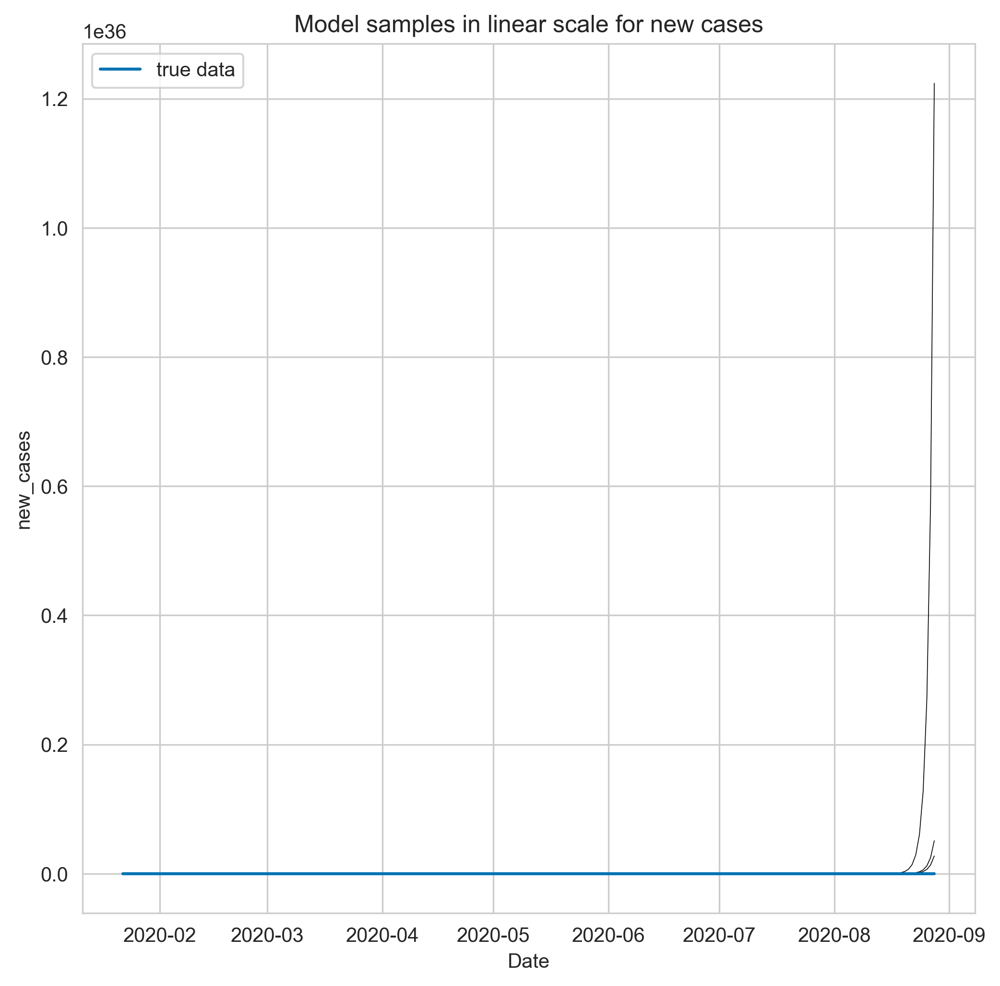

In [110]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines_new(posterior_mu, posterior_sigma, 200, scale='linear')
plt.plot(data['date'][:220], data['new_cases'][:220], label='true data')
plt.legend()
plt.xlabel('Date')
plt.ylabel('new_cases')
plt.title('Model samples in linear scale for new cases');

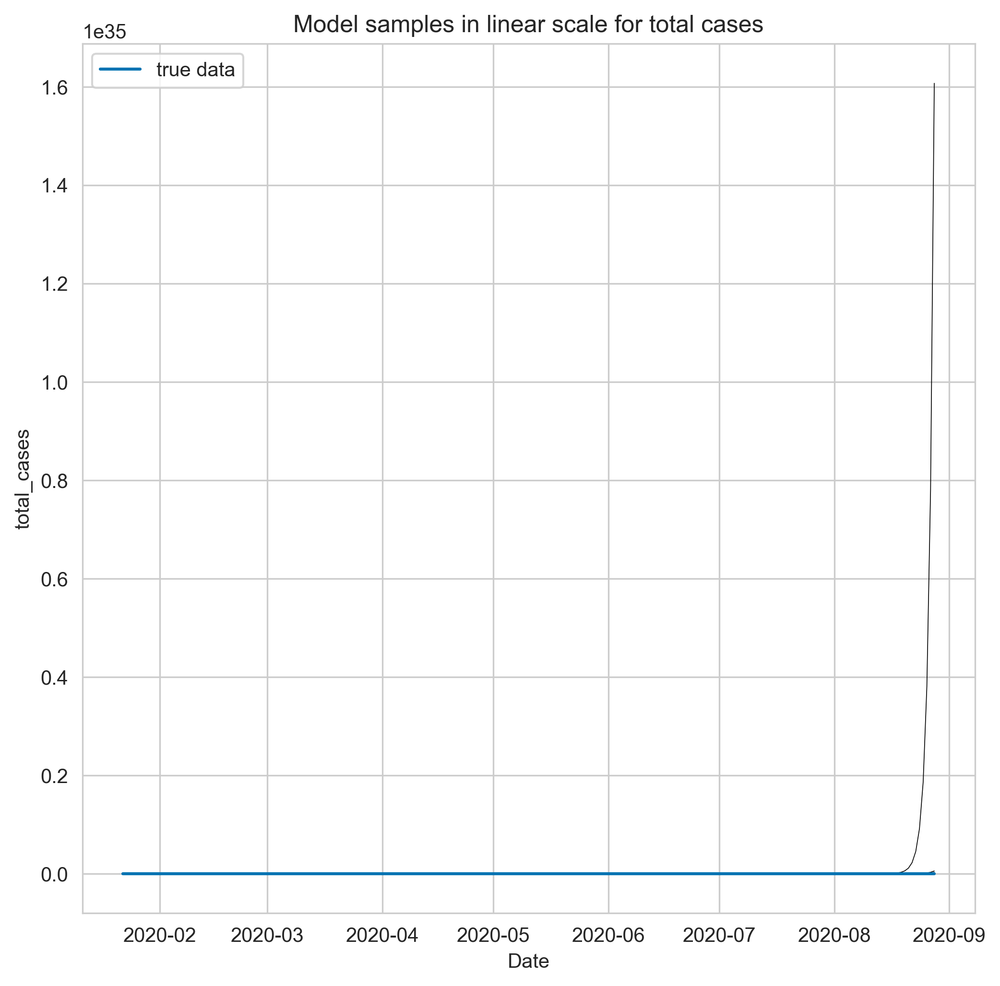

In [111]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines_total(posterior_mu, posterior_sigma, 200, scale='linear')
plt.plot(data['date'][:220], data['total_cases'][:220], label='true data')
plt.legend()
plt.xlabel('Date')
plt.ylabel('total_cases')
plt.title('Model samples in linear scale for total cases');

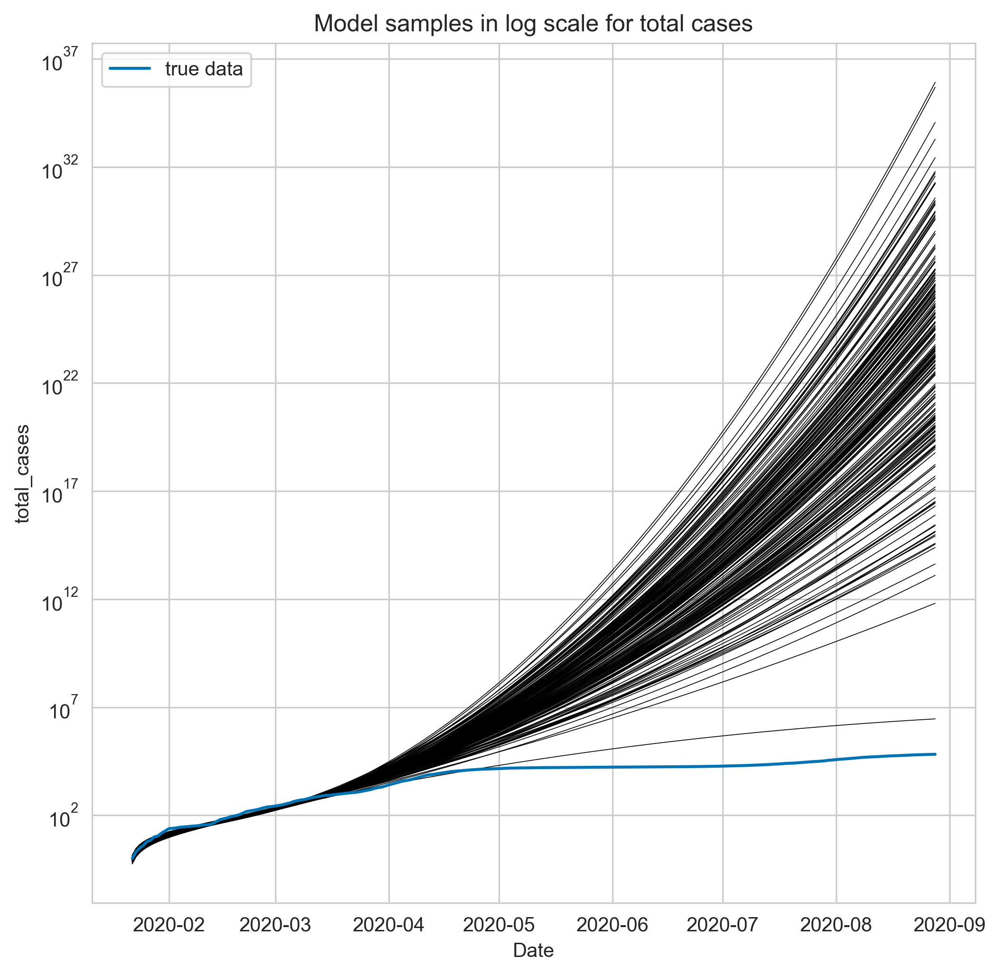

In [112]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
#ax.set_xlim((days[40], None))
#ax.set_ylim((-2, 2))
myplot_sample_lines_total(posterior_mu, posterior_sigma, 200, scale='log')
plt.plot(data['date'][:220], data['total_cases'][:220], label='true data')
plt.legend()
plt.xlabel('Date')
plt.ylabel('total_cases')
plt.title('Model samples in log scale for total cases');

К сожалению, бонусное задание у меня не получилось :( Причина мне непонятна. Предалагаю разбить страны на два кластера, один тот где наша регрессия работает и другой тот в котором не работает. Я проверил несколько стран, на всех была такая ситуация :(